Predictive Modeling for Global CO2 Emission

Team Member:
1. Chaitali Khadse - Data Transformation; Data Cleaning; Some part of EDA and Data manipulation, Predicitve Modelling and Analysis - Clustering and ARIMA
2. Juan Lopez - Key findings, ⁠Research questions, Top 10 countries historical and forcasted CO2 emissions
3. Nisha Patil - Exploratory Data Analysis, Data Manipulation, Data Visualization, Correlation Analysis - Data Correlation  
4. Sai Preethi Kancharla - Feature Engineering, Data Manipulation, Visualization , some part of Predictive Modelling

Importing all required Libraries

In [8]:
!pip install pmdarima

   ---------------------------------------- 0.0/625.1 kB ? eta -:--:--
   --------------------------------- ------ 524.3/625.1 kB 8.2 MB/s eta 0:00:01
   ---------------------------------------- 625.1/625.1 kB 2.9 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   ---------------------------------------- 2.8/2.8 MB 20.2 MB/s eta 0:00:00


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
# Enable inline plotting
%matplotlib inline

Loading the Global CO2 emissions dataset

DATA CLEANING AND DATA HANDLING

In [2]:
file_path = r"C:\Users\msunn\OneDrive - UNCG\645\Project\NewFile\reshaped_dataset.xlsx"
data = pd.read_excel(file_path, sheet_name=None)
sheet_names = list(data.keys())
print("Sheet names in the Excel file:", sheet_names)

Sheet names in the Excel file: ['CO2 Emissions', 'CO2 Emissions Intensities', 'CO2 Emissions Multipliers', 'Clustering']


Inspecting Data for Accuracy

In [3]:
for sheet_name, df in data.items():
    print(f"\n--- {sheet_name} ---")
    print(df.info())


--- CO2 Emissions ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 71 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ObjectId                  1080 non-null   int64  
 1   Year                      1080 non-null   int64  
 2   Industry                  1080 non-null   object 
 3   Unit                      1080 non-null   object 
 4   Indicator                 1080 non-null   object 
 5   Argentina                 1056 non-null   float64
 6   Australia                 1056 non-null   float64
 7   Austria                   1051 non-null   float64
 8   Belgium                   1030 non-null   float64
 9   Brazil                    1056 non-null   float64
 10  Brunei Darussalam         746 non-null    float64
 11  Bulgaria                  1044 non-null   float64
 12  Cambodia                  830 non-null    float64
 13  Canada                    1056 non-null 

Checking missing values

In [17]:
for sheet_name, df in data.items():
    print(f"\n--- Missing Values in {sheet_name} ---")
    print(df.isnull().sum())
    print(f"Total missing values in {sheet_name}: {df.isnull().sum().sum()}")



--- Missing Values in CO2 Emissions ---
ObjectId           0
Year               0
Industry           0
Unit               0
Indicator          0
                  ..
Tunisia           24
Turkey            24
United Kingdom    24
United States     24
Vietnam           33
Length: 71, dtype: int64
Total missing values in CO2 Emissions: 4216

--- Missing Values in CO2 Emissions Intensities ---
ObjectId           0
Year               0
Industry           0
Unit               0
Indicator          0
                  ..
Tunisia           24
Turkey            24
United Kingdom    24
United States     24
Vietnam           33
Length: 71, dtype: int64
Total missing values in CO2 Emissions Intensities: 4216

--- Missing Values in CO2 Emissions Multipliers ---
ObjectId           0
Year               0
Industry           0
Unit               0
Indicator          0
                  ..
Tunisia           24
Turkey            24
United Kingdom    24
United States     24
Vietnam           24
Length: 71

Handling Missing Values

In [18]:
# Create a dictionary to hold the cleaned data for all sheets
cleaned_data = {}

# Handling missing values for each sheet
for sheet_name, df in data.items():
    print(f"\nHandling missing values for {sheet_name}...")

    # Ensure numeric columns are inferred properly
    df = df.infer_objects()

    # Interpolate numeric columns
    interpolated_df = df.copy()
    for col in df.select_dtypes(include=['float', 'int']).columns:
        interpolated_df[col] = df[col].interpolate(method='linear', axis=0)

    # Forward fill
    ffill_df = interpolated_df.ffill()

    # Backward fill
    final_df = ffill_df.bfill()

    # Add the cleaned DataFrame to the dictionary
    cleaned_data[sheet_name] = final_df

    # Verifying that there are no remaining NaNs
    print(f"Remaining missing values in {sheet_name}: {final_df.isnull().sum().sum()}")



Handling missing values for CO2 Emissions...
Remaining missing values in CO2 Emissions: 0

Handling missing values for CO2 Emissions Intensities...
Remaining missing values in CO2 Emissions Intensities: 0

Handling missing values for CO2 Emissions Multipliers...
Remaining missing values in CO2 Emissions Multipliers: 0


Performing Exploratory Data Analysis

DATA EXPLORATION

In [19]:
for sheet_name, df in cleaned_data.items():
    print(f"\n--- EDA for {sheet_name} ---")

    # 1. Summary Statistics
    print("\nSummary Statistics:")
    print(df.describe())  # Summary for numeric columns

    # 2. Missing Values Verification
    print("\nMissing Values After Cleaning:")
    print(df.isnull().sum())  # Ensure no missing values remain


--- EDA for CO2 Emissions ---

Summary Statistics:
         ObjectId         Year    Argentina    Australia      Austria  \
count  1080.00000  1080.000000  1080.000000  1080.000000  1080.000000   
mean    540.50000  2006.500000     2.419669     7.247410     1.079161   
std     311.91345     6.925393     5.831435    27.523043     2.146356   
min       1.00000  1995.000000     0.004000     0.024000     0.001000   
25%     270.75000  2000.750000     0.146500     0.310250     0.154000   
50%     540.50000  2006.500000     0.408000     0.753000     0.356500   
75%     810.25000  2012.250000     2.288750     4.183750     1.045250   
max    1080.00000  2018.000000    49.863000   217.637000    14.375000   

           Belgium       Brazil  Brunei Darussalam     Bulgaria     Cambodia  \
count  1080.000000  1080.000000        1080.000000  1080.000000  1080.000000   
mean      1.839052     5.894926           0.246119     0.962494     0.076106   
std       3.681559    10.635222           0.519793

In [584]:
# Loop through all sheets
for sheet_name, df in cleaned_data.items():
    print(f"\nProcessing {sheet_name}...")

    # Select only numeric columns from column index 5 onward
    numeric_columns = df.iloc[:, 5:].select_dtypes(include=[np.number])

    # Check if there are numeric columns
    if numeric_columns.empty:
        print(f"No numeric data to process in {sheet_name}. Skipping...")
        continue

    # Aggregate emissions by country across industries
    country_totals = numeric_columns.sum(axis=0).sort_values(ascending=False)
    print(f"Top 5 emitting countries in {sheet_name}:\n{country_totals.head()}")



Processing CO2 Emissions...
Top 5 emitting countries in CO2 Emissions:
China, P.R.: Mainland    140074.3955
United States            103226.6670
Russian Federation        32733.9605
India                     29941.9350
Japan                     25063.5430
dtype: float64

Processing CO2 Emissions Intensities...
Top 5 emitting countries in CO2 Emissions Intensities:
Lao People's Dem. Rep.    3.379937e+06
Kazakhstan, Rep. of       3.180495e+06
Brunei Darussalam         2.417579e+06
Saudi Arabia              1.476459e+06
South Africa              1.321391e+06
dtype: float64

Processing CO2 Emissions Multipliers...
Top 5 emitting countries in CO2 Emissions Multipliers:
Kazakhstan, Rep. of      4.966566e+06
Russian Federation       2.646361e+06
South Africa             2.434185e+06
Saudi Arabia             2.111411e+06
China, P.R.: Mainland    2.011595e+06
dtype: float64

Processing Clustering...
Top 5 emitting countries in Clustering:
F1998    6.143740e+06
F1995    6.065450e+06
F1999    6.


Processing CO2 Emissions Sheet...


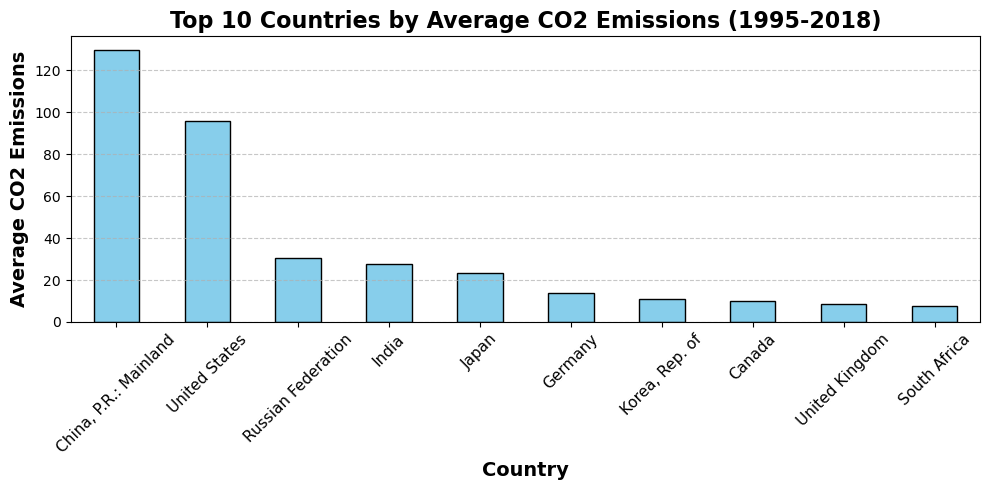

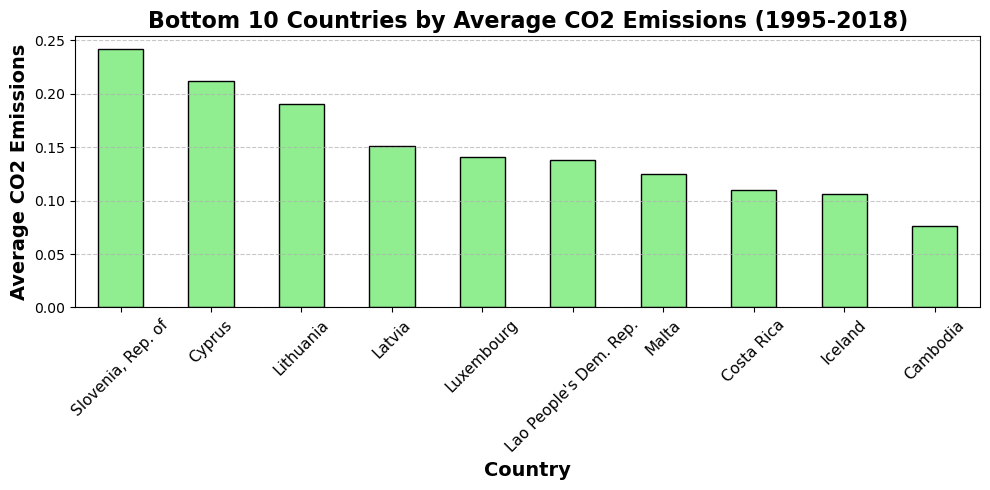


Top 10 Countries by Average CO2 Emissions (1995-2018):
China, P.R.: Mainland    129.698514
United States             95.580247
Russian Federation        30.309223
India                     27.724014
Japan                     23.206984
Germany                   13.794145
Korea, Rep. of            11.021133
Canada                     9.826867
United Kingdom             8.393165
South Africa               7.661957
dtype: float64

Bottom 10 Countries by Average CO2 Emissions (1995-2018):
Slovenia, Rep. of         0.241679
Cyprus                    0.212147
Lithuania                 0.190103
Latvia                    0.150702
Luxembourg                0.140423
Lao People's Dem. Rep.    0.138271
Malta                     0.124546
Costa Rica                0.109531
Iceland                   0.106470
Cambodia                  0.076106
dtype: float64


In [20]:
# Extract the "CO2 Emissions" sheet for processing
co2_emissions = cleaned_data.get("CO2 Emissions")  # Retrieve the "CO2 Emissions" sheet
if co2_emissions is not None:
    print("\nProcessing CO2 Emissions Sheet...")

    # Select country columns (all columns after the metadata columns)
    country_columns = co2_emissions.columns[5:]  # Assuming ObjectId, Year, Industry, Unit, Indicator are metadata

    # Calculate the average CO2 emissions across all years and industries for each country
    average_emissions = co2_emissions[country_columns].mean().sort_values(ascending=False)

    # Extracting top 10 and bottom 10 countries
    top_10 = average_emissions.head(10)
    bottom_10 = average_emissions.tail(10)

    # Plotting top 10 countries
    plt.figure(figsize=(10, 5))
    top_10.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title("Top 10 Countries by Average CO2 Emissions (1995-2018)", fontsize=16, fontweight='bold')
    plt.xlabel("Country", fontsize=14, fontweight='bold')
    plt.ylabel("Average CO2 Emissions", fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=11)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Plotting bottom 10 countries
    plt.figure(figsize=(10, 5))
    bottom_10.plot(kind='bar', color='lightgreen', edgecolor='black')
    plt.title("Bottom 10 Countries by Average CO2 Emissions (1995-2018)", fontsize=16, fontweight='bold')
    plt.xlabel("Country", fontsize=14, fontweight='bold')
    plt.ylabel("Average CO2 Emissions", fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=11)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Display the results in the console
    print("\nTop 10 Countries by Average CO2 Emissions (1995-2018):")
    print(top_10)
    print("\nBottom 10 Countries by Average CO2 Emissions (1995-2018):")
    print(bottom_10)

else:
    print("CO2 Emissions sheet not found!")


Mean, median, max, min CO2 emissions

In [68]:
# Extract the "CO2 Emissions" sheet
co2_emissions = cleaned_data.get("CO2 Emissions")  # Replace 'cleaned_data' with your actual dictionary if needed

if co2_emissions is not None:
    # Select all country columns (ignoring metadata columns like ObjectId, Year, Industry, etc.)
    country_columns = co2_emissions.columns[5:]  # Assuming country data starts from the 6th column onward

    # Calculate mean, median, max, and min for each country
    co2_stats = pd.DataFrame({
        "Country": country_columns,
        "Mean": co2_emissions[country_columns].mean(),
        "Median": co2_emissions[country_columns].median(),
        "Max": co2_emissions[country_columns].max(),
        "Min": co2_emissions[country_columns].min()
    }).reset_index(drop=True)

    # Display the result
    print(co2_stats)
else:
    print("The 'CO2 Emissions' sheet is not available.")


           Country        Mean      Median        Max        Min
0        Argentina    2.419669    0.408000     49.863   0.004000
1        Australia    7.247410    0.753000    217.637   0.024000
2          Austria    1.079161    0.356500     14.375   0.001000
3          Belgium    1.839052    0.573000     25.322   0.001000
4           Brazil    5.894926    0.813500     76.500   0.017000
..             ...         ...         ...        ...        ...
63  United Kingdom    8.393165    2.266000    189.927   0.003000
64   United States   95.580247   25.447000   2512.903   0.286000
65         Vietnam    2.146834    0.295000    118.187   0.001000
66          Global  476.302276  107.689667  11950.073  12.376975
67       Total_CO2  952.604552  215.379333  23900.146  24.753950

[68 rows x 5 columns]


Line chart for Global CO2 emissions over the Years.

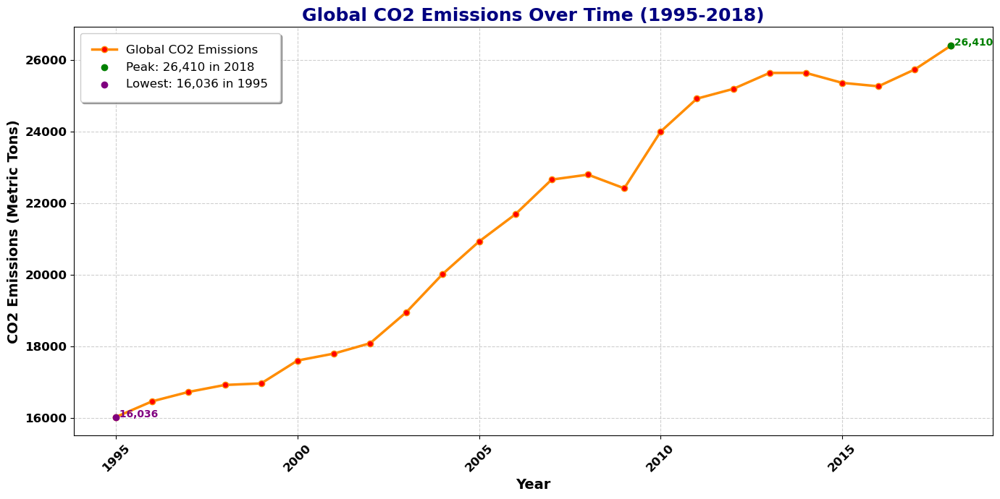

In [22]:
# Calculate Global CO2 Emissions by summing across all countries for each year
country_columns = co2_emissions.columns[5:]  # Select all country columns (skip metadata columns like ObjectId, Year, etc.)
co2_emissions['Global'] = co2_emissions[country_columns].sum(axis=1)

# Group by Year to calculate Global CO2 Emissions over time
global_emissions = co2_emissions.groupby('Year')['Global'].sum()

# Plot Global CO2 Emissions over time
plt.figure(figsize=(14, 7))
plt.plot(
    global_emissions.index, global_emissions.values,
    label='Global CO2 Emissions',
    color='darkorange', linewidth=2.5, marker='o', markersize=6, markerfacecolor='red'
)

# Add gridlines for better readability
plt.grid(True, linestyle='--', alpha=0.6)

# Highlight specific points on the curve (e.g., max and min emissions)
max_year = global_emissions.idxmax()
max_value = global_emissions.max()
plt.scatter(max_year, max_value, color='green', label=f'Peak: {max_value:,.0f} in {max_year}', zorder=5)

min_year = global_emissions.idxmin()
min_value = global_emissions.min()
plt.scatter(min_year, min_value, color='purple', label=f'Lowest: {min_value:,.0f} in {min_year}', zorder=5)

# Add labels for peak and lowest emissions
plt.text(max_year, max_value, f' {max_value:,.0f}', color='green', fontsize=10, fontweight='bold')
plt.text(min_year, min_value, f' {min_value:,.0f}', color='purple', fontsize=10, fontweight='bold')

# Add title and labels with styling
plt.title('Global CO2 Emissions Over Time (1995-2018)', fontsize=18, fontweight='bold', color='navy')
plt.xlabel('Year', fontsize=14, fontweight='bold')
plt.ylabel('CO2 Emissions (Metric Tons)', fontsize=14, fontweight='bold')

# Customize tick labels
plt.xticks(fontsize=12, fontweight='bold', rotation=45)
plt.yticks(fontsize=12, fontweight='bold')

# Add a legend
plt.legend(fontsize=12, loc='upper left', frameon=True, shadow=True, borderpad=1)

# Optimize layout
plt.tight_layout()

# Show the plot
plt.show()


Line chart for top 10 Country-level CO2 emissions over the Years.

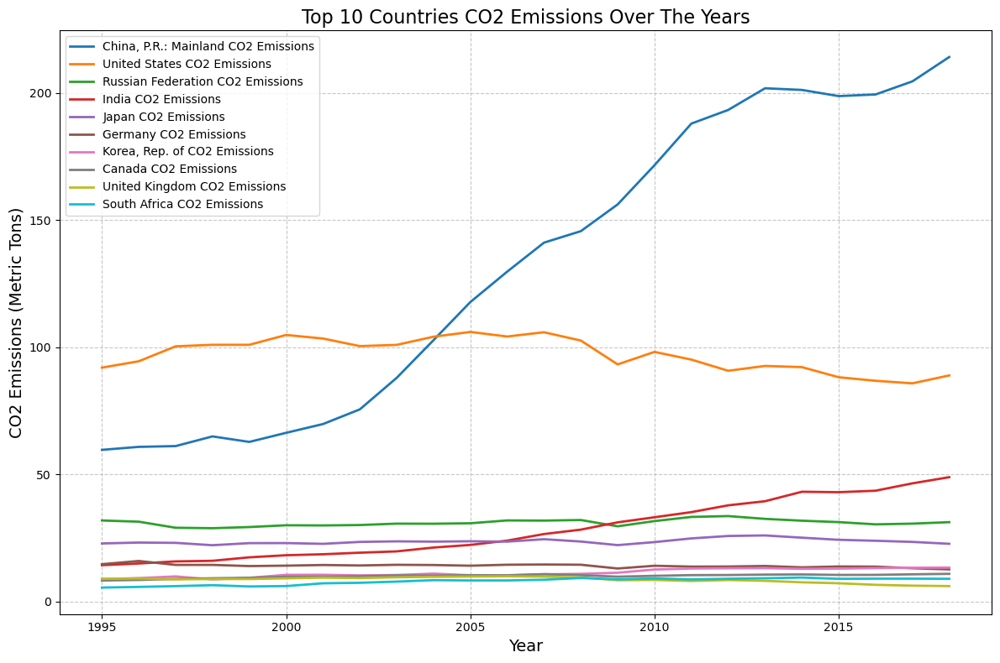

In [23]:
# Calculate average emissions for each country to determine the top 10
co2_emissions = data.get("CO2 Emissions")  # Retrieve the "CO2 Emissions" sheet
country_columns = co2_emissions.columns[5:]  # Select columns starting from the 6th column onward
average_emissions = co2_emissions[country_columns].mean().sort_values(ascending=False)
top_10_countries = average_emissions.head(10).index.tolist()  # Get names of top 10 countries

# Group by Year to calculate emissions over time for the top 10 countries
grouped_data = co2_emissions.groupby('Year').agg({col: 'mean' for col in top_10_countries})

# Plot CO2 Emissions for all top 10 countries in a single chart
plt.figure(figsize=(12, 8))
for country in top_10_countries:
    plt.plot(grouped_data.index, grouped_data[country], label=f'{country} CO2 Emissions', linewidth=2)

# Add chart details
plt.title('Top 10 Countries CO2 Emissions Over The Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('CO2 Emissions (Metric Tons)', fontsize=14)
plt.legend(loc='upper left', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()


Line chart for top 10 Industry-level CO2 emissions over the Years.

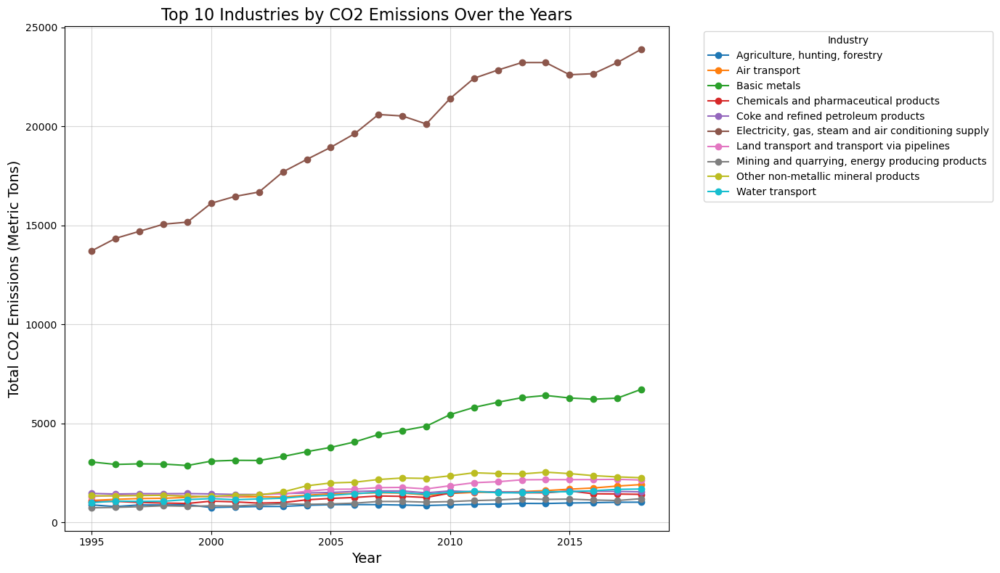

In [24]:
# Summing CO2 emissions across all countries (ignoring non-relevant columns)
co2_emissions = cleaned_data.get("CO2 Emissions")  # Retrieve the specific sheet
country_columns = co2_emissions.columns[5:]  # Columns starting from the 6th (country data)
co2_emissions['Total_CO2'] = co2_emissions[country_columns].sum(axis=1)

# Grouping by Industry and summing emissions over all years
total_emissions_by_industry = co2_emissions.groupby("Industry")['Total_CO2'].sum().sort_values(ascending=False)

# Selecting the top 10 industries
top_10_industries = total_emissions_by_industry.head(10).index

# Filtering the data for the top 10 industries
filtered_data = co2_emissions[co2_emissions['Industry'].isin(top_10_industries)]

# Creating a pivot table for easier plotting
pivot_data = filtered_data.pivot(index="Year", columns="Industry", values="Total_CO2")

# Plotting the line chart
plt.figure(figsize=(14, 8))
for industry in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[industry], label=industry, marker='o')

plt.title("Top 10 Industries by CO2 Emissions Over the Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Total CO2 Emissions (Metric Tons)", fontsize=14)
plt.legend(title="Industry", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(alpha=0.5)
plt.tight_layout()
plt.show()


Country Wise Average CO2 Emissions for all countries (Dropdown)

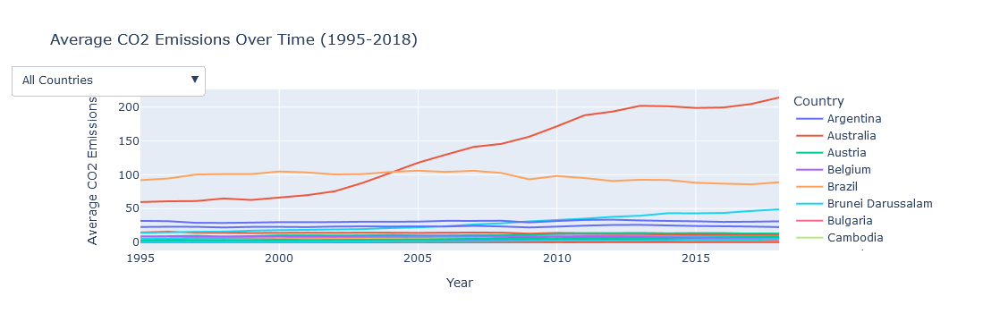

In [25]:
co2_emissions = data.get("CO2 Emissions")  # Retrieve the CO2 Emissions sheet
melted_data = co2_emissions.melt(
    id_vars=['Year'],
    value_vars=co2_emissions.columns[5:],  # Columns for countries
    var_name='Country',
    value_name='Emissions'
)


melted_data['Year'] = pd.to_numeric(melted_data['Year'], errors='coerce')

# Group by Year and Country to calculate the average emissions
avg_emissions = (
    melted_data.groupby(['Year', 'Country'])['Emissions']
    .mean()
    .reset_index()
)

# Create an interactive line chart with a filter for countries
fig = px.line(
    avg_emissions,
    x='Year',
    y='Emissions',
    color='Country',
    title='Average CO2 Emissions Over Time (1995-2018)',
    labels={'Emissions': 'Average CO2 Emissions', 'Year': 'Year'},
)

# Add dropdown filter for countries
countries = avg_emissions['Country'].unique()
fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {
                    "method": "update",
                    "label": "All Countries",
                    "args": [{"visible": [True] * len(countries)}],
                }
            ]
            + [
                {
                    "method": "update",
                    "label": country,
                    "args": [
                        {"visible": [col == country for col in countries]},
                    ],
                }
                for country in countries
            ],
            "direction": "down",
            "showactive": True,
            "x": 0.1,  # Adjust dropdown placement
            "y": 1.15,
        }
    ]
)

# Show the figure
fig.show()


Comparision between emissions across regions specifically continents by their average CO2 Emissions


Average CO2 Emissions by Continent (1995-2018):
Continent
North America    28.157711
Asia             11.848396
Oceania           3.926867
Europe            3.083828
Africa            2.936610
South America     2.271485
Name: Emissions, dtype: float64


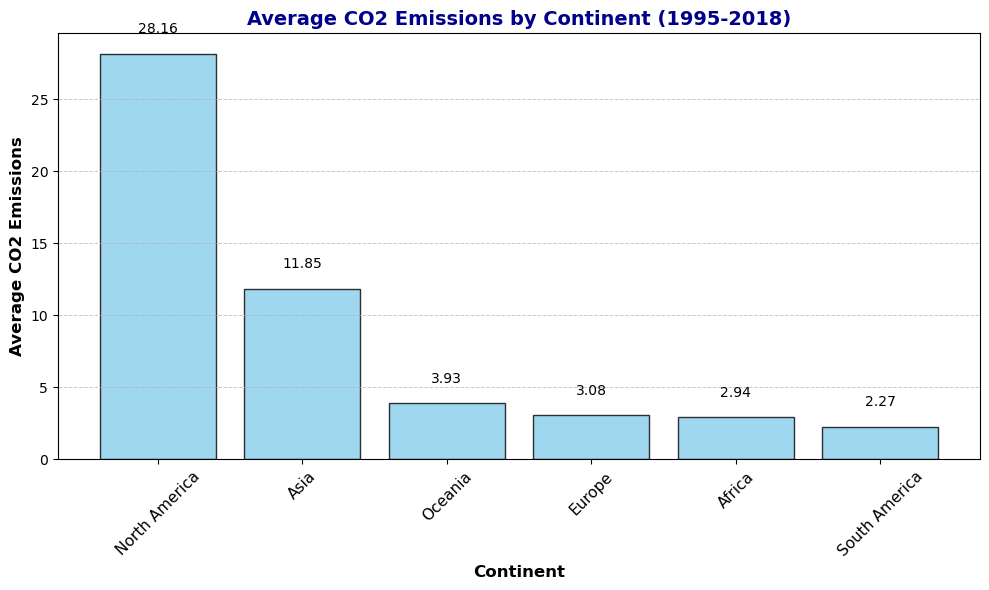

In [26]:
region_mapping = {
    "Argentina": "South America",
    "Australia": "Oceania",
    "Austria": "Europe",
    "Belgium": "Europe",
    "Brazil": "South America",
    "Brunei Darussalam": "Asia",
    "Bulgaria": "Europe",
    "Cambodia": "Asia",
    "Canada": "North America",
    "Chile": "South America",
    "China, P.R.: Hong Kong": "Asia",
    "China, P.R.: Mainland": "Asia",
    "Colombia": "South America",
    "Costa Rica": "North America",
    "Croatia, Rep. of": "Europe",
    "Cyprus": "Europe",
    "Czech Rep.": "Europe",
    "Denmark": "Europe",
    "Estonia, Rep. of": "Europe",
    "Finland": "Europe",
    "France": "Europe",
    "Germany": "Europe",
    "Greece": "Europe",
    "Hungary": "Europe",
    "Iceland": "Europe",
    "India": "Asia",
    "Indonesia": "Asia",
    "Ireland": "Europe",
    "Israel": "Asia",
    "Italy": "Europe",
    "Japan": "Asia",
    "Kazakhstan, Rep. of": "Asia",
    "Korea, Rep. of": "Asia",
    "Lao People's Dem. Rep.": "Asia",
    "Latvia": "Europe",
    "Lithuania": "Europe",
    "Luxembourg": "Europe",
    "Malaysia": "Asia",
    "Malta": "Europe",
    "Mexico": "North America",
    "Morocco": "Africa",
    "Myanmar": "Asia",
    "Netherlands, The": "Europe",
    "New Zealand": "Oceania",
    "Norway": "Europe",
    "Peru": "South America",
    "Philippines": "Asia",
    "Poland, Rep. of": "Europe",
    "Portugal": "Europe",
    "Romania": "Europe",
    "Russian Federation": "Europe",
    "Saudi Arabia": "Asia",
    "Singapore": "Asia",
    "Slovak Rep.": "Europe",
    "Slovenia, Rep. of": "Europe",
    "South Africa": "Africa",
    "Spain": "Europe",
    "Sweden": "Europe",
    "Switzerland": "Europe",
    "Taiwan Province of China": "Asia",
    "Thailand": "Asia",
    "Tunisia": "Africa",
    "Turkey": "Asia",
    "United Kingdom": "Europe",
    "United States": "North America",
    "Vietnam": "Asia",
    "Nigeria": "Africa",
    "Egypt": "Africa",
    "Algeria": "Africa",
    "Kenya": "Africa",
    "Tanzania": "Africa"
}

co2_emissions = cleaned_data.get("CO2 Emissions")

if co2_emissions is not None:

    melted_data = co2_emissions.melt(
        id_vars=['Year', 'Industry', 'Unit', 'Indicator'],  # Columns to keep
        var_name='Country',  # Create a 'Country' column
        value_name='Emissions'  # CO2 emissions value column
    )

    # Map countries to their respective continents
    melted_data['Continent'] = melted_data['Country'].map(region_mapping)

    # Remove rows with missing emissions
    melted_data = melted_data.dropna(subset=['Emissions'])

    # Calculate the average CO2 emissions for each continent over the years and all activities
    continent_avg_emissions = (
        melted_data.groupby('Continent')['Emissions']
        .mean()
        .sort_values(ascending=False)  # Sort continents by emissions
    )

    # Display the result as a summary table
    print("\nAverage CO2 Emissions by Continent (1995-2018):")
    print(continent_avg_emissions)

    # Plot the results
    plt.figure(figsize=(10, 6))
    bars = plt.bar(continent_avg_emissions.index, continent_avg_emissions, color='skyblue', edgecolor='black', alpha=0.8)

    # Add annotations on the bars
    for bar, value in zip(bars, continent_avg_emissions):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.05 * max(continent_avg_emissions),
                 f"{value:,.2f}", ha='center', fontsize=10)

    # Add labels, title, and gridlines
    plt.title("Average CO2 Emissions by Continent (1995-2018)", fontsize=14, fontweight='bold', color='darkblue')
    plt.xlabel("Continent", fontsize=12, fontweight='bold')
    plt.ylabel("Average CO2 Emissions", fontsize=12, fontweight='bold')
    plt.xticks(rotation=45, fontsize=11)
    plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)

    # Show the plot
    plt.tight_layout()
    plt.show()

else:
    print("CO2 Emissions sheet not found!")


Correlation for each pair of CO2 emissions and Intensities per country.

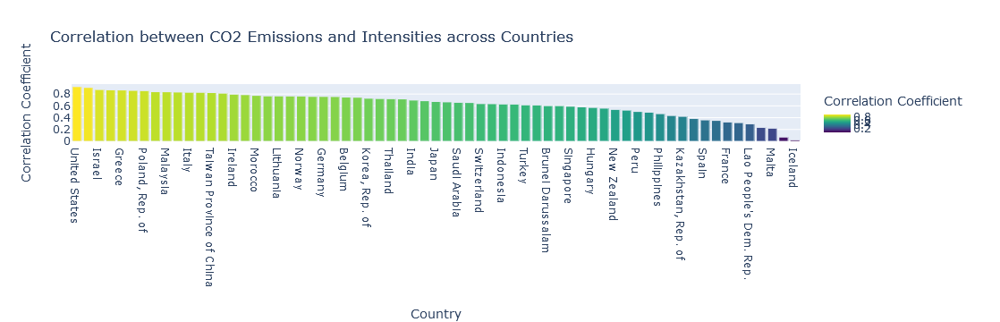

In [7]:
# Load the data sheets
co2_emissions = data.get("CO2 Emissions")
co2_intensities = data.get("CO2 Emissions Intensities") 

if co2_emissions is not None and co2_intensities is not None:
    # Extract country columns (ignore metadata like ObjectId, Year, etc.)
    countries = co2_emissions.columns[6:]  # Assuming country data starts at the 6th column
    
    # Calculate correlations between CO2 Emissions and Intensities for each country
    correlations = {
        country: co2_emissions[country].corr(co2_intensities[country])
        for country in countries
    }
    
    # Convert the results to a DataFrame
    correlation_df = pd.DataFrame({
        "Country": correlations.keys(),
        "Correlation": correlations.values()
    }).sort_values(by="Correlation", ascending=False)
    
    # Visualize using Plotly
    fig = px.bar(correlation_df, x="Country", y="Correlation",
                 title="Correlation between CO2 Emissions and Intensities across Countries",
                 labels={"Correlation": "Correlation Coefficient"}, color="Correlation",
                 color_continuous_scale="Viridis")
    fig.show()
else:
    print("One or both required sheets are missing.")

Correlations with CO2 Emissions and Intensities for Top 10 Positive and Negative countries.

Top 10 Economic Indicators with Positive Correlation to CO2 Emissions:
          Economic Indicator  Correlation
9     China, P.R.: Hong Kong     0.755683
63             United States     0.743338
6                   Cambodia     0.736423
58  Taiwan Province of China     0.735046
36                  Malaysia     0.725310
27                    Israel     0.719379
38                    Mexico     0.718665
24                     India     0.695892
0                  Australia     0.691520
51                 Singapore     0.666222

Top 10 Economic Indicators with Negative Correlation to CO2 Emissions:
        Economic Indicator  Correlation
11                Colombia     0.248242
33                  Latvia     0.246656
12              Costa Rica     0.223506
19                  France     0.219793
43                  Norway     0.197950
32  Lao People's Dem. Rep.     0.172098
37                   Malta     0.170987
57             Switzerland     0.143643
53       Slovenia, Rep. of     0.10

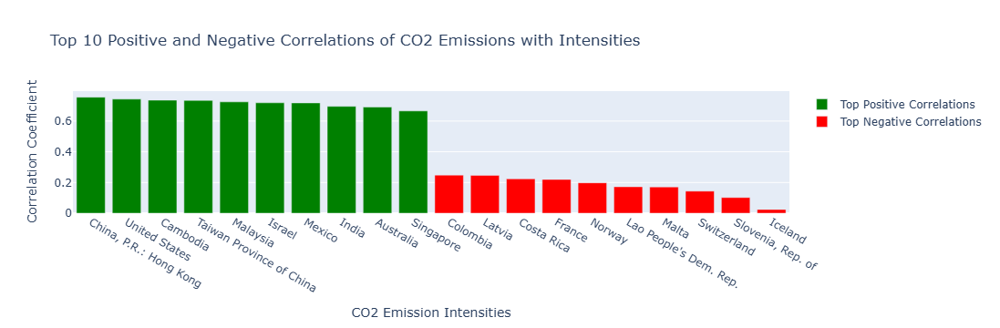

In [12]:
# Calculate correlations between all CO2 emissions and Intensities for all countries
economic_indicators = co2_intensities.columns[6:] 
indicator_correlation = {
    indicator: co2_emissions.iloc[:, 6:].corrwith(co2_intensities[indicator]).mean()
    for indicator in economic_indicators
}

# Convert the correlation results into a DataFrame
indicator_correlation_df = pd.DataFrame({
    "Economic Indicator": indicator_correlation.keys(),
    "Correlation": indicator_correlation.values()
}).sort_values(by="Correlation", ascending=False)

# Highlight the top 10 positive and negative correlations
top_positive = indicator_correlation_df.head(10)
top_negative = indicator_correlation_df.tail(10)

# Display the results
print("Top 10 Economic Indicators with Positive Correlation to CO2 Emissions:")
print(top_positive)

print("\nTop 10 Economic Indicators with Negative Correlation to CO2 Emissions:")
print(top_negative)

# Plot the results
import plotly.graph_objects as go

fig = go.Figure()

# Add top positive indicators
fig.add_trace(go.Bar(
    x=top_positive["Economic Indicator"],
    y=top_positive["Correlation"],
    name="Top Positive Correlations",
    marker_color="green"
))

# Add top negative indicators
fig.add_trace(go.Bar(
    x=top_negative["Economic Indicator"],
    y=top_negative["Correlation"],
    name="Top Negative Correlations",
    marker_color="red"
))

# Update layout
fig.update_layout(
    title="Top 10 Positive and Negative Correlations of CO2 Emissions with Intensities",
    xaxis_title="CO2 Emission Intensities",
    yaxis_title="Correlation Coefficient",
    barmode="group",
    height=600
)

fig.show()

FEATURE ENGINEERING

In [30]:
# Loop through each sheet to process and display Year-over-Year Growth Rate
for sheet_name, df in data.items():
    # Skip the "Clustering" sheet
    if sheet_name == "Clustering":
        print(f"Skipping the {sheet_name} sheet...")
        continue

    print(f"\nProcessing Year-over-Year Growth Rate for {sheet_name}...")

    # Ensure 'Year' column exists
    if 'Year' not in df.columns:
        print(f"Skipping {sheet_name} as it does not contain a 'Year' column.")
        continue

    # Filter for years 2009–2018
    filtered_df = df[df['Year'].between(2009, 2018)].copy()

    # Calculate Year-over-Year Growth Rate for country columns
    country_columns = filtered_df.columns[5:]  # Ignore metadata columns
    growth_rate = filtered_df[country_columns].pct_change(fill_method=None).fillna(0) * 100  # Calculate growth rate

    # Summarize growth rate by calculating the mean growth rate for each country across the period
    mean_growth_rate = growth_rate.mean(axis=0).sort_values(ascending=False)

    # Display the top 5 and bottom 5 countries by average growth rate
    print(f"Top 5 countries by average Year-over-Year Growth Rate in {sheet_name}:\n{mean_growth_rate.head()}")
    print(f"Bottom 5 countries by average Year-over-Year Growth Rate in {sheet_name}:\n{mean_growth_rate.tail()}")



Processing Year-over-Year Growth Rate for CO2 Emissions...
Top 5 countries by average Year-over-Year Growth Rate in CO2 Emissions:
Singapore                 32329.743846
China, P.R.: Hong Kong    30215.109370
Chile                     28122.107178
Peru                      13891.042221
South Africa              11758.175902
dtype: float64
Bottom 5 countries by average Year-over-Year Growth Rate in CO2 Emissions:
Netherlands, The    961.291006
Malta               946.473506
Spain               897.764004
France              607.230055
Cyprus              293.623817
dtype: float64

Processing Year-over-Year Growth Rate for CO2 Emissions Intensities...
Top 5 countries by average Year-over-Year Growth Rate in CO2 Emissions Intensities:
China, P.R.: Hong Kong    13402.670545
South Africa               7647.084058
Morocco                    4866.091282
Singapore                  4815.054653
Vietnam                    4095.507868
dtype: float64
Bottom 5 countries by average Year-over-Year Gr

 Top 10 highest avg growth rate of CO2 emissions over the period 2009-2018

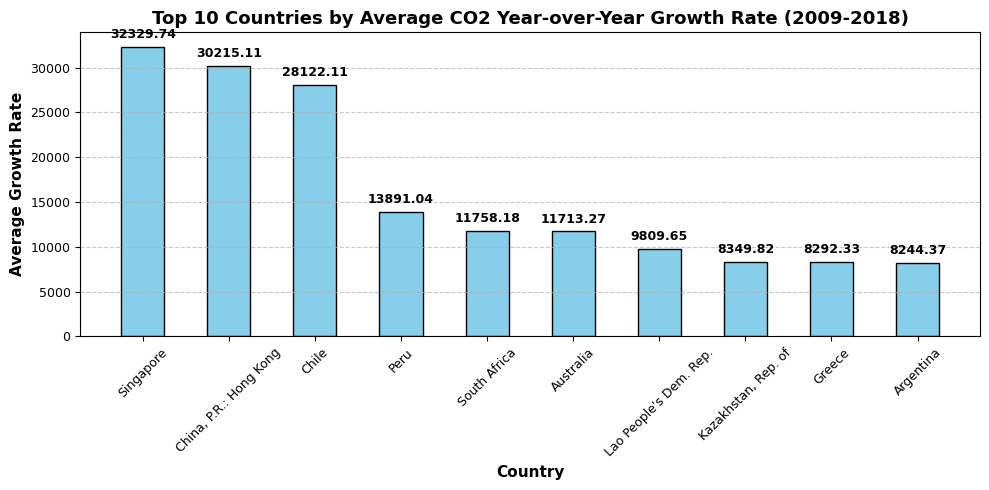

Singapore                 32329.743846
China, P.R.: Hong Kong    30215.109370
Chile                     28122.107178
Peru                      13891.042221
South Africa              11758.175902
Australia                 11713.269139
Lao People's Dem. Rep.     9809.645724
Kazakhstan, Rep. of        8349.815849
Greece                     8292.332839
Argentina                  8244.374942
dtype: float64

In [31]:
# compute Year-over-Year Growth Rate for the CO2 Emissions sheet
co2_emissions = data.get("CO2 Emissions")  # Load the CO2 Emissions sheet
filtered_df = co2_emissions[co2_emissions['Year'].between(2009, 2018)].copy()  # Filter for 2009–2018
country_columns = filtered_df.columns[5:]  # Select country columns (exclude metadata)

# Calculate Year-over-Year Growth Rate without clipping
growth_rate_recomputed = filtered_df[country_columns].pct_change(fill_method=None).fillna(0) * 100

#calculate the mean growth rate for each country
mean_growth_rate_recomputed = growth_rate_recomputed.mean(axis=0).sort_values(ascending=False)

# Select the top 10 countries by average growth rate
top_10_countries_recomputed = mean_growth_rate_recomputed.head(10)

#Plot the bar chart
plt.figure(figsize=(10, 5))
bars = plt.bar(
    top_10_countries_recomputed.index,
    top_10_countries_recomputed.values,
    color='skyblue',
    edgecolor='black',
    width=0.5
)

# Add value labels above each bar
for bar, value in zip(bars, top_10_countries_recomputed.values):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 1000,
        f"{value:.2f}",
        ha='center',
        fontsize=9,
        fontweight='bold'
    )

# Add titles and labels
plt.title("Top 10 Countries by Average CO2 Year-over-Year Growth Rate (2009-2018)", fontsize=13, fontweight='bold')
plt.xlabel("Country", fontsize=11, fontweight='bold')
plt.ylabel("Average Growth Rate", fontsize=11, fontweight='bold')
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Tight layout for better alignment
plt.tight_layout()
plt.show()

# Display the recalculated top 10 countries for cross-verification
top_10_countries_recomputed


Bottom 10 Countries by Average CO2 Year-over-Year Growth Rate (2009-2018)

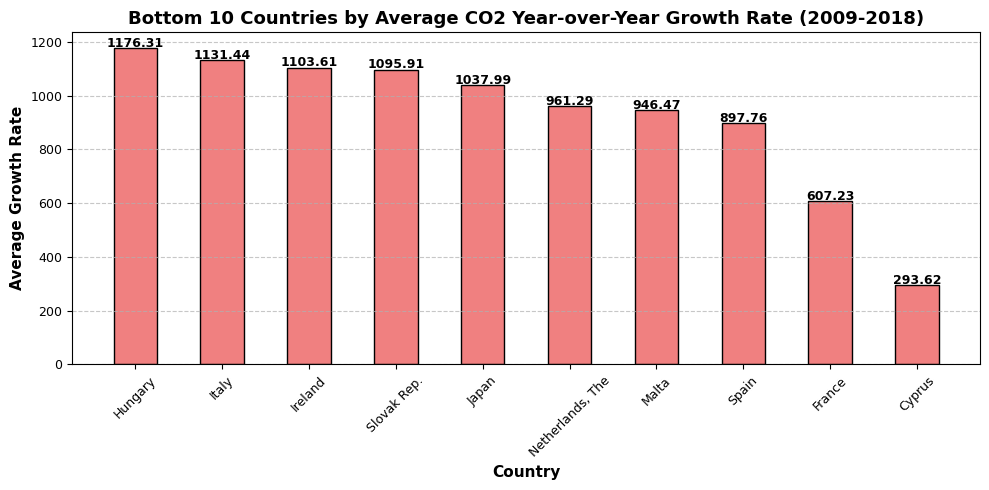

Hungary             1176.306109
Italy               1131.439335
Ireland             1103.609571
Slovak Rep.         1095.911730
Japan               1037.992181
Netherlands, The     961.291006
Malta                946.473506
Spain                897.764004
France               607.230055
Cyprus               293.623817
dtype: float64

In [32]:
#  Select the bottom 10 countries by average growth rate
bottom_10_countries = mean_growth_rate_recomputed.tail(10)

# Plot the bar chart for bottom 10 countries
plt.figure(figsize=(10, 5))
bars = plt.bar(
    bottom_10_countries.index,
    bottom_10_countries.values,
    color='lightcoral',
    edgecolor='black',
    width=0.5
)

# Add value labels above each bar
for bar, value in zip(bars, bottom_10_countries.values):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 5,
        f"{value:.2f}",
        ha='center',
        fontsize=9,
        fontweight='bold'
    )

# Add titles and labels
plt.title("Bottom 10 Countries by Average CO2 Year-over-Year Growth Rate (2009-2018)", fontsize=13, fontweight='bold')
plt.xlabel("Country", fontsize=11, fontweight='bold')
plt.ylabel("Average Growth Rate", fontsize=11, fontweight='bold')
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Tight layout for better alignment
plt.tight_layout()
plt.show()

# Display the recalculated bottom 10 countries for cross-verification
bottom_10_countries


Computing cumulative CO2 emissions for all three sheets

In [70]:
# Compute cumulative emissions for all valid sheets
cumulative_emissions_data = {}

for sheet_name, df in data.items():
    # Skip the "Clustering" sheet
    if sheet_name == "Clustering":
        print(f"Skipping the {sheet_name} sheet...")
        continue

    # Ensure 'Year' column exists
    if 'Year' not in df.columns:
        print(f"Skipping {sheet_name} as it does not contain a 'Year' column.")
        continue

    # Filter data for 2009–2018
    filtered_df = df[df['Year'].between(2009, 2018)].copy()

    # Select country columns, ignoring metadata
    country_columns = filtered_df.columns[5:]  # Assuming first 5 columns are metadata
    if country_columns.empty:
        print(f"No valid country columns in {sheet_name}. Skipping...")
        continue

    # Compute cumulative emissions for each country
    cumulative_emissions = filtered_df[country_columns].sum(axis=0).sort_values(ascending=False)
    cumulative_emissions_data[sheet_name] = cumulative_emissions

# Display top 5 and bottom 5 countries for each sheet
for sheet_name, cumulative_emissions in cumulative_emissions_data.items():
    print(f"\nProcessing Cumulative Emissions for {sheet_name}...")
    print(f"Top 5 countries by cumulative emissions in {sheet_name}:\n{cumulative_emissions.head()}")
    print(f"Bottom 5 countries by cumulative emissions in {sheet_name}:\n{cumulative_emissions.tail()}")


Skipping the Clustering sheet...

Processing Cumulative Emissions for CO2 Emissions...
Top 5 countries by cumulative emissions in CO2 Emissions:
China, P.R.: Mainland    84892.365
United States            40124.065
India                    17673.230
Russian Federation       13886.822
Japan                    10619.171
dtype: float64
Bottom 5 countries by cumulative emissions in CO2 Emissions:
Cyprus        52.805
Cambodia      50.781
Costa Rica    46.910
Iceland       32.541
Malta         32.080
dtype: float64

Processing Cumulative Emissions for CO2 Emissions Intensities...
Top 5 countries by cumulative emissions in CO2 Emissions Intensities:
Slovenia, Rep. of      473270.070173
Kazakhstan, Rep. of    456792.940227
Saudi Arabia           456077.833426
South Africa           357408.277091
Brunei Darussalam      301060.925271
dtype: float64
Bottom 5 countries by cumulative emissions in CO2 Emissions Intensities:
Sweden         45767.806026
Costa Rica     44611.269109
Norway         4227

Global cummulative CO2 emissions (2009-2018)

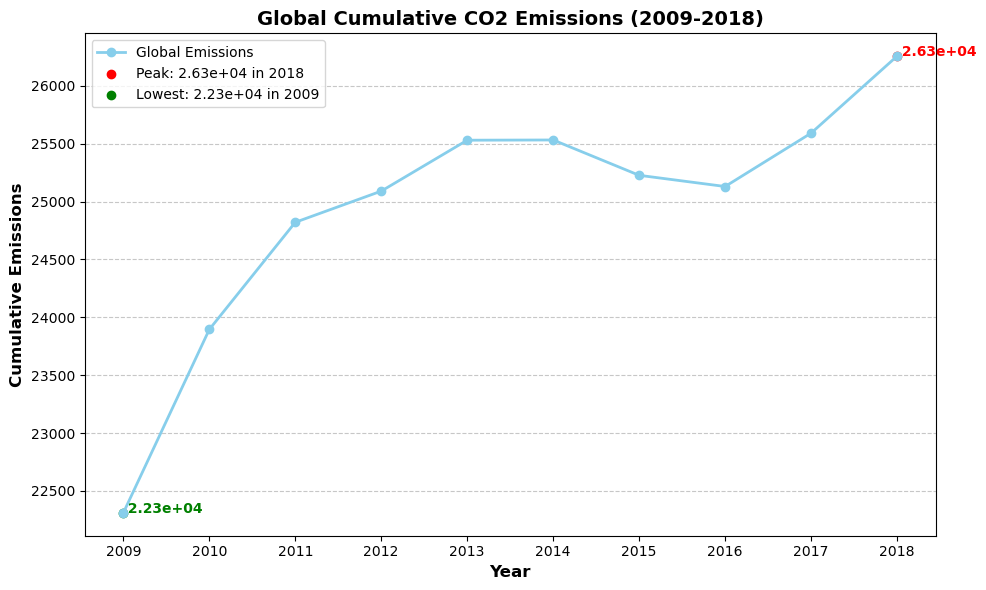

In [34]:
#  Calculate global cumulative CO2 emissions by year (2009–2018)
co2_emissions = data.get("CO2 Emissions")  # Load the CO2 Emissions sheet
filtered_df = co2_emissions[co2_emissions['Year'].between(2009, 2018)].copy()
country_columns = filtered_df.columns[5:]  # Select country columns

# Calculate total global emissions for each year
filtered_df['Global Emissions'] = filtered_df[country_columns].sum(axis=1)

# Extract year and global emissions
global_emissions_by_year = filtered_df[['Year', 'Global Emissions']].groupby('Year').sum()

#  Plot global cumulative CO2 emissions
plt.figure(figsize=(10, 6))
plt.plot(
    global_emissions_by_year.index,
    global_emissions_by_year['Global Emissions'],
    marker='o',
    color='skyblue',
    linewidth=2,
    label="Global Emissions"
)

# Highlight the peak and lowest values
peak_year = global_emissions_by_year['Global Emissions'].idxmax()
peak_value = global_emissions_by_year['Global Emissions'].max()
plt.scatter(peak_year, peak_value, color='red', label=f"Peak: {peak_value:.2e} in {peak_year}")

low_year = global_emissions_by_year['Global Emissions'].idxmin()
low_value = global_emissions_by_year['Global Emissions'].min()
plt.scatter(low_year, low_value, color='green', label=f"Lowest: {low_value:.2e} in {low_year}")

# Add labels for peak and lowest points
plt.text(
    peak_year, peak_value, f" {peak_value:.2e}", color='red', fontsize=10, fontweight='bold'
)
plt.text(
    low_year, low_value, f" {low_value:.2e}", color='green', fontsize=10, fontweight='bold'
)

# Add titles and labels
plt.title("Global Cumulative CO2 Emissions (2009-2018)", fontsize=14, fontweight='bold')
plt.xlabel("Year", fontsize=12, fontweight='bold')
plt.ylabel("Cumulative Emissions", fontsize=12, fontweight='bold')
plt.xticks(global_emissions_by_year.index, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend
plt.legend(fontsize=10, loc='upper left')

# Tight layout for better spacing
plt.tight_layout()
plt.show()


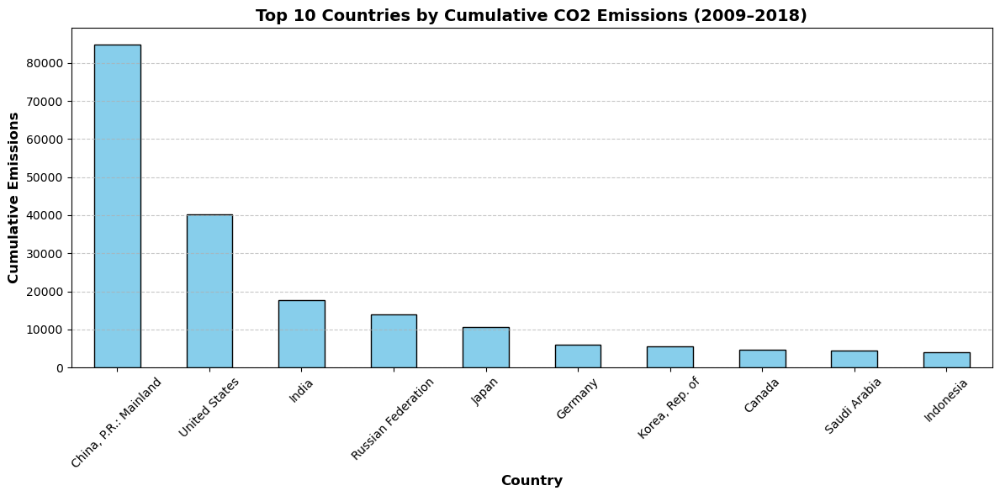

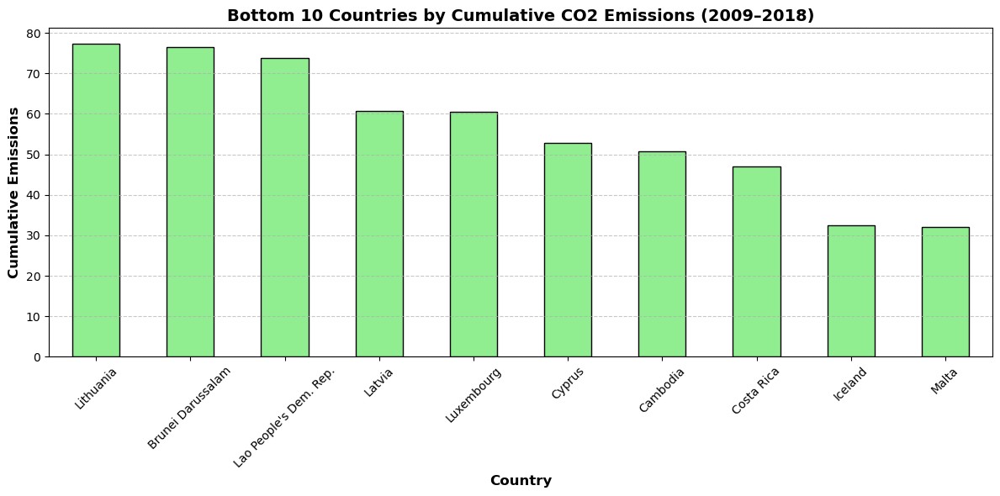

In [627]:

# Load the CO2 Emissions sheet
co2_emissions = data.get("CO2 Emissions")

# Filter the data for the years 2009–2018
filtered_df = co2_emissions[co2_emissions['Year'].between(2009, 2018)].copy()

# Select columns corresponding to countries
country_columns = filtered_df.columns[5:]

# Calculate total emissions for each country over the specified years
cumulative_emissions = filtered_df[country_columns].sum(axis=0).sort_values(ascending=False)

# Extract top 10 and bottom 10 countries based on cumulative emissions
top_10_countries = cumulative_emissions.head(10)
bottom_10_countries = cumulative_emissions.tail(10)

import matplotlib.pyplot as plt

# Plot the top 10 countries
plt.figure(figsize=(12, 6))
top_10_countries.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Top 10 Countries by Cumulative CO2 Emissions (2009–2018)", fontsize=14, fontweight='bold')
plt.xlabel("Country", fontsize=12, fontweight='bold')
plt.ylabel("Cumulative Emissions", fontsize=12, fontweight='bold')
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot the bottom 10 countries
plt.figure(figsize=(12, 6))
bottom_10_countries.plot(kind='bar', color='lightgreen', edgecolor='black')
plt.title("Bottom 10 Countries by Cumulative CO2 Emissions (2009–2018)", fontsize=14, fontweight='bold')
plt.xlabel("Country", fontsize=12, fontweight='bold')
plt.ylabel("Cumulative Emissions", fontsize=12, fontweight='bold')
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Industry level cummulative co2 emissions from 2009-2018

In [36]:
# Step 1: Group data by industry and calculate cumulative emissions for each industry
industry_cumulative_emissions = {}

for sheet_name, df in data.items():
    print(f"\nProcessing {sheet_name}...")

    # Exclude the 'Clustering' sheet
    if sheet_name == "Clustering":
        print(f"Skipping {sheet_name}: Excluded explicitly.")
        continue

    # Check if the 'Year' column exists in the DataFrame
    if 'Year' not in df.columns:
        print(f"Skipping {sheet_name}: 'Year' column not found.")
        continue

    # Filter for years 2009–2018
    filtered_df = df[df['Year'].between(2009, 2018)].copy()

    # Check if the 'Industry' column exists in the DataFrame
    if 'Industry' not in df.columns:
        print(f"Skipping {sheet_name}: 'Industry' column not found.")
        continue

    # Compute cumulative emissions for each industry
    try:
        industry_emissions = (
            filtered_df.groupby('Industry')
            .sum(numeric_only=True)
            .sum(axis=1)
            .sort_values(ascending=False)
        )
        industry_cumulative_emissions[sheet_name] = industry_emissions
    except Exception as e:
        print(f"Error processing {sheet_name}: {e}")
        continue

# Step 2: Display top 5 and bottom 5 industries for each sheet
for sheet_name, industry_emissions in industry_cumulative_emissions.items():
    print(f"\nProcessing Cumulative Emissions by Industry for {sheet_name}...")
    print(f"Top 5 industries by cumulative emissions in {sheet_name}:\n{industry_emissions.head()}")
    print(f"Bottom 5 industries by cumulative emissions in {sheet_name}:\n{industry_emissions.tail()}")



Processing CO2 Emissions...

Processing CO2 Emissions Intensities...

Processing CO2 Emissions Multipliers...

Processing Cumulative Emissions by Industry for CO2 Emissions...
Top 5 industries by cumulative emissions in CO2 Emissions:
Industry
Electricity, gas, steam and air conditioning supply    141449.078
Basic metals                                            58718.607
Other non-metallic mineral products                     40684.567
Land transport and transport via pipelines              38931.136
Water transport                                         36646.674
dtype: float64
Bottom 5 industries by cumulative emissions in CO2 Emissions:
Industry
Accomodation and food services                                                                                                29010.428
Electrical equipment                                                                                                          28951.735
Other transport equipment                                          

Top 10 and Bottom 10 Cummulative emissions based on industries

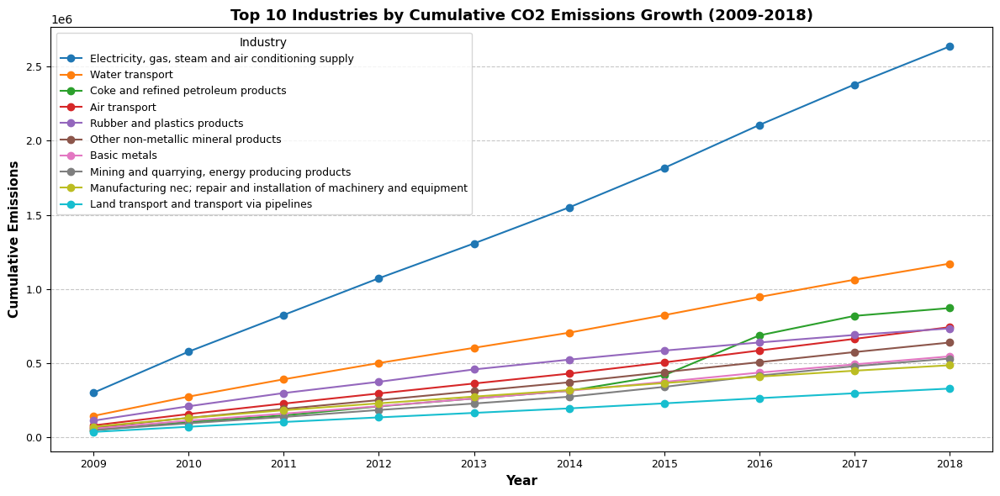

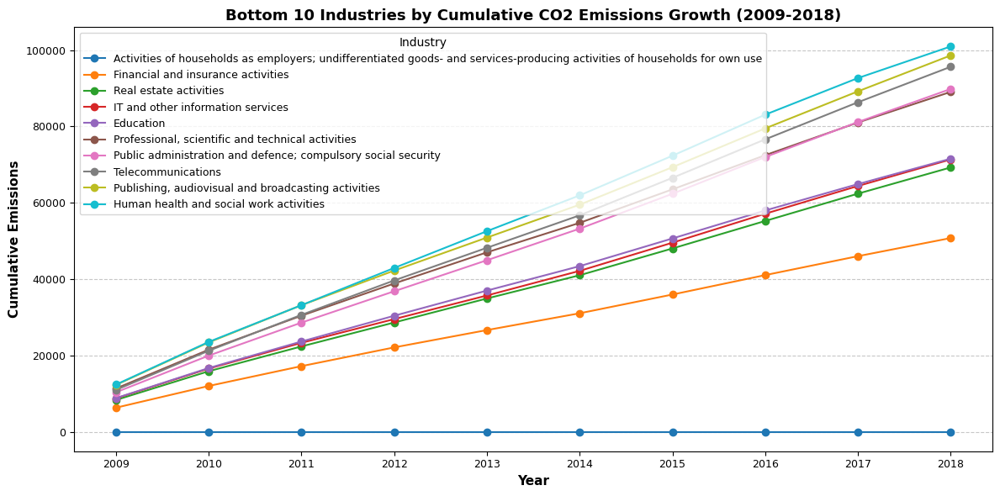

In [37]:
# Group by Year and Industry to calculate cumulative emissions for industries
industry_grouped = filtered_df.groupby(['Year', 'Industry'])[country_columns].sum().sum(axis=1).reset_index()

# Pivot table to have industries as columns and years as index
industry_pivot = industry_grouped.pivot(index='Year', columns='Industry', values=0).cumsum()

# Extract Top 10 and Bottom 10 industries by cumulative emissions
top_10_industries = industry_pivot.iloc[-1].nlargest(10).index
bottom_10_industries = industry_pivot.iloc[-1].nsmallest(10).index

# Filter cumulative emissions for the selected industries
top_10_industries_cumsum = industry_pivot[top_10_industries]
bottom_10_industries_cumsum = industry_pivot[bottom_10_industries]

# Plot Top 10 industries cumulative emissions growth
plt.figure(figsize=(12, 6))
for industry in top_10_industries_cumsum.columns:
    plt.plot(
        top_10_industries_cumsum.index,
        top_10_industries_cumsum[industry],
        marker='o',
        label=industry
    )

# Add titles and labels
plt.title("Top 10 Industries by Cumulative CO2 Emissions Growth (2009-2018)", fontsize=13, fontweight='bold')
plt.xlabel("Year", fontsize=11, fontweight='bold')
plt.ylabel("Cumulative Emissions", fontsize=11, fontweight='bold')
plt.xticks(top_10_industries_cumsum.index, fontsize=9)
plt.yticks(fontsize=9)
plt.legend(title="Industry", fontsize=9, loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Tight layout for better spacing
plt.tight_layout()
plt.show()

# Plot Bottom 10 industries cumulative emissions growth
plt.figure(figsize=(12, 6))
for industry in bottom_10_industries_cumsum.columns:
    plt.plot(
        bottom_10_industries_cumsum.index,
        bottom_10_industries_cumsum[industry],
        marker='o',
        label=industry
    )

# Add titles and labels
plt.title("Bottom 10 Industries by Cumulative CO2 Emissions Growth (2009-2018)", fontsize=13, fontweight='bold')
plt.xlabel("Year", fontsize=11, fontweight='bold')
plt.ylabel("Cumulative Emissions", fontsize=11, fontweight='bold')
plt.xticks(bottom_10_industries_cumsum.index, fontsize=9)
plt.yticks(fontsize=9)
plt.legend(title="Industry", fontsize=9, loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Tight layout for better spacing
plt.tight_layout()
plt.show()

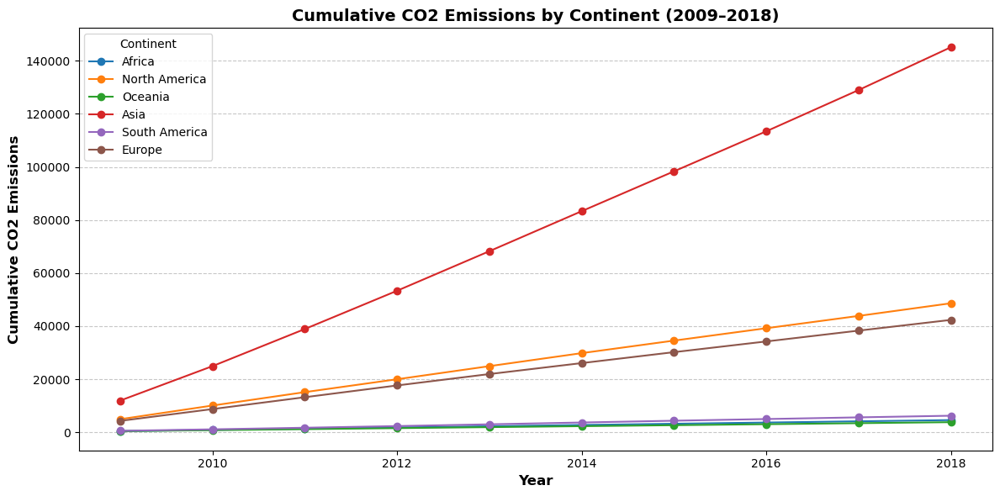

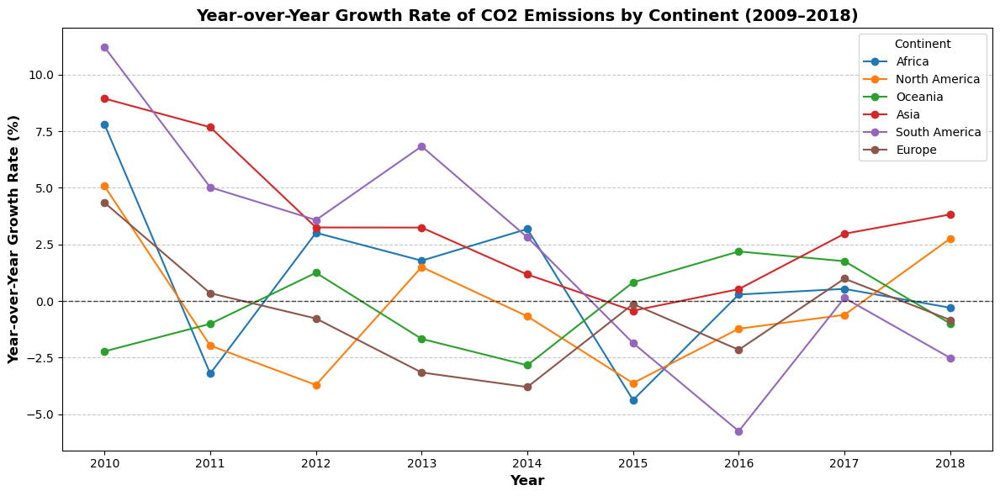

In [62]:

# Load the cleaned dataset
file_path = r"C:\Users\preet\Downloads\reshaped_dataset_cleaned.xlsx"
data = pd.ExcelFile(file_path)
co2_emissions = data.parse("CO2 Emissions")

# Load the region mapping
region_mapping = {
    "Argentina": "South America",
    "Australia": "Oceania",
    "Austria": "Europe",
    "Belgium": "Europe",
    "Brazil": "South America",
    "Brunei Darussalam": "Asia",
    "Bulgaria": "Europe",
    "Cambodia": "Asia",
    "Canada": "North America",
    "Chile": "South America",
    "China, P.R.: Hong Kong": "Asia",
    "China, P.R.: Mainland": "Asia",
    "Colombia": "South America",
    "Costa Rica": "North America",
    "Croatia, Rep. of": "Europe",
    "Cyprus": "Europe",
    "Czech Rep.": "Europe",
    "Denmark": "Europe",
    "Estonia, Rep. of": "Europe",
    "Finland": "Europe",
    "France": "Europe",
    "Germany": "Europe",
    "Greece": "Europe",
    "Hungary": "Europe",
    "Iceland": "Europe",
    "India": "Asia",
    "Indonesia": "Asia",
    "Ireland": "Europe",
    "Israel": "Asia",
    "Italy": "Europe",
    "Japan": "Asia",
    "Kazakhstan, Rep. of": "Asia",
    "Korea, Rep. of": "Asia",
    "Lao People's Dem. Rep.": "Asia",
    "Latvia": "Europe",
    "Lithuania": "Europe",
    "Luxembourg": "Europe",
    "Malaysia": "Asia",
    "Malta": "Europe",
    "Mexico": "North America",
    "Morocco": "Africa",
    "Myanmar": "Asia",
    "Netherlands, The": "Europe",
    "New Zealand": "Oceania",
    "Norway": "Europe",
    "Peru": "South America",
    "Philippines": "Asia",
    "Poland, Rep. of": "Europe",
    "Portugal": "Europe",
    "Romania": "Europe",
    "Russian Federation": "Europe",
    "Saudi Arabia": "Asia",
    "Singapore": "Asia",
    "Slovak Rep.": "Europe",
    "Slovenia, Rep. of": "Europe",
    "South Africa": "Africa",
    "Spain": "Europe",
    "Sweden": "Europe",
    "Switzerland": "Europe",
    "Taiwan Province of China": "Asia",
    "Thailand": "Asia",
    "Tunisia": "Africa",
    "Turkey": "Asia",
    "United Kingdom": "Europe",
    "United States": "North America",
    "Vietnam": "Asia",
    "Nigeria": "Africa",
    "Egypt": "Africa",
    "Algeria": "Africa",
    "Kenya": "Africa",
    "Tanzania": "Africa"
}

# Filter for the years 2009–2018
filtered_df = co2_emissions[co2_emissions['Year'].between(2009, 2018)].copy()

# Map countries to continents and aggregate emissions
country_columns = filtered_df.columns[5:]  # Select country columns (exclude metadata)
for continent in set(region_mapping.values()):
    filtered_df[continent] = 0  # Initialize continent columns

for country in country_columns:
    continent = region_mapping.get(country, "Unknown")
    if continent != "Unknown":
        filtered_df[continent] += filtered_df[country]

# Group by year and continent
continent_columns = list(set(region_mapping.values()))  # List of continents
continent_data = filtered_df.groupby('Year')[continent_columns].sum().reset_index()

# Calculate cumulative emissions and year-over-year growth rates
continent_data_melted = continent_data.melt(id_vars='Year', var_name='Continent', value_name='CO2 Emissions')
continent_data_melted['Cumulative CO2 Emissions'] = continent_data_melted.groupby('Continent')['CO2 Emissions'].cumsum()
continent_data_melted['Year-over-Year Growth Rate'] = continent_data_melted.groupby('Continent')['CO2 Emissions'].pct_change() * 100

# Plot Cumulative CO2 Emissions (Figure 1)
plt.figure(figsize=(12, 6))
for continent in continent_data_melted['Continent'].unique():
    continent_yearly = continent_data_melted[continent_data_melted['Continent'] == continent]
    plt.plot(
        continent_yearly['Year'],
        continent_yearly['Cumulative CO2 Emissions'],
        marker='o',
        label=continent
    )

plt.title("Cumulative CO2 Emissions by Continent (2009–2018)", fontsize=14, fontweight='bold')
plt.xlabel("Year", fontsize=12, fontweight='bold')
plt.ylabel("Cumulative CO2 Emissions", fontsize=12, fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title="Continent", fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot Year-over-Year Growth Rates (Figure 2)
plt.figure(figsize=(12, 6))
for continent in continent_data_melted['Continent'].unique():
    continent_yearly = continent_data_melted[continent_data_melted['Continent'] == continent]
    plt.plot(
        continent_yearly['Year'],
        continent_yearly['Year-over-Year Growth Rate'],
        marker='o',
        label=continent
    )

plt.title("Year-over-Year Growth Rate of CO2 Emissions by Continent (2009–2018)", fontsize=14, fontweight='bold')
plt.xlabel("Year", fontsize=12, fontweight='bold')
plt.ylabel("Year-over-Year Growth Rate (%)", fontsize=12, fontweight='bold')
plt.axhline(0, color='black', linewidth=1, linestyle='--', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title="Continent", fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


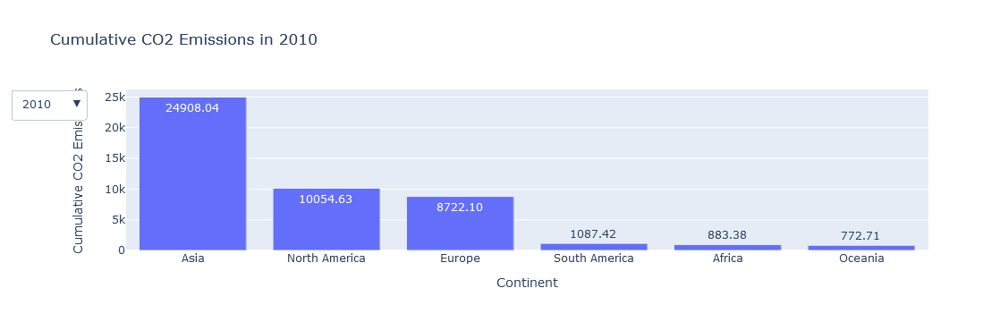

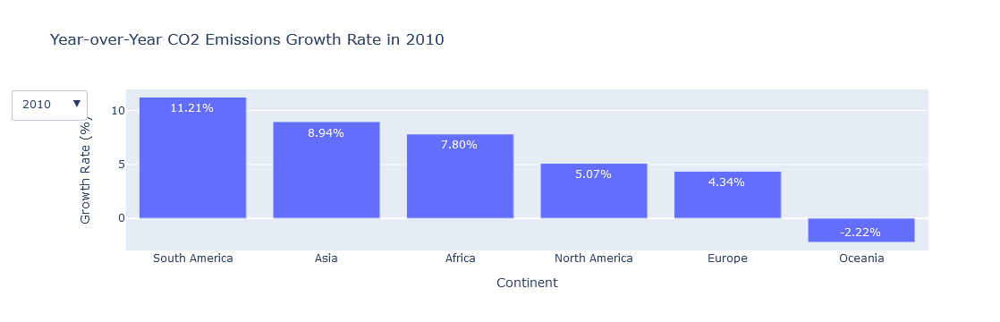

In [64]:
# Load the cleaned dataset
file_path = r"C:\Users\preet\Downloads\reshaped_dataset_cleaned.xlsx"
data = pd.ExcelFile(file_path)
co2_emissions = data.parse("CO2 Emissions")

# Use the provided region mapping
region_mapping = {
    "Argentina": "South America",
    "Australia": "Oceania",
    "Austria": "Europe",
    "Belgium": "Europe",
    "Brazil": "South America",
    "Brunei Darussalam": "Asia",
    "Bulgaria": "Europe",
    "Cambodia": "Asia",
    "Canada": "North America",
    "Chile": "South America",
    "China, P.R.: Hong Kong": "Asia",
    "China, P.R.: Mainland": "Asia",
    "Colombia": "South America",
    "Costa Rica": "North America",
    "Croatia, Rep. of": "Europe",
    "Cyprus": "Europe",
    "Czech Rep.": "Europe",
    "Denmark": "Europe",
    "Estonia, Rep. of": "Europe",
    "Finland": "Europe",
    "France": "Europe",
    "Germany": "Europe",
    "Greece": "Europe",
    "Hungary": "Europe",
    "Iceland": "Europe",
    "India": "Asia",
    "Indonesia": "Asia",
    "Ireland": "Europe",
    "Israel": "Asia",
    "Italy": "Europe",
    "Japan": "Asia",
    "Kazakhstan, Rep. of": "Asia",
    "Korea, Rep. of": "Asia",
    "Lao People's Dem. Rep.": "Asia",
    "Latvia": "Europe",
    "Lithuania": "Europe",
    "Luxembourg": "Europe",
    "Malaysia": "Asia",
    "Malta": "Europe",
    "Mexico": "North America",
    "Morocco": "Africa",
    "Myanmar": "Asia",
    "Netherlands, The": "Europe",
    "New Zealand": "Oceania",
    "Norway": "Europe",
    "Peru": "South America",
    "Philippines": "Asia",
    "Poland, Rep. of": "Europe",
    "Portugal": "Europe",
    "Romania": "Europe",
    "Russian Federation": "Europe",
    "Saudi Arabia": "Asia",
    "Singapore": "Asia",
    "Slovak Rep.": "Europe",
    "Slovenia, Rep. of": "Europe",
    "South Africa": "Africa",
    "Spain": "Europe",
    "Sweden": "Europe",
    "Switzerland": "Europe",
    "Taiwan Province of China": "Asia",
    "Thailand": "Asia",
    "Tunisia": "Africa",
    "Turkey": "Asia",
    "United Kingdom": "Europe",
    "United States": "North America",
    "Vietnam": "Asia",
    "Nigeria": "Africa",
    "Egypt": "Africa",
    "Algeria": "Africa",
    "Kenya": "Africa",
    "Tanzania": "Africa"
}

# Filter for the years 2009–2018
filtered_df = co2_emissions[co2_emissions['Year'].between(2009, 2018)].copy()

# Aggregate emissions by continent
country_columns = filtered_df.columns[5:]  # Exclude metadata columns
continent_emissions = filtered_df.melt(id_vars=['Year'], value_vars=country_columns, var_name='Country', value_name='CO2 Emissions')

# Map countries to their respective continents
continent_emissions['Continent'] = continent_emissions['Country'].map(region_mapping)
continent_emissions = continent_emissions.groupby(['Year', 'Continent']).sum().reset_index()

# Calculate cumulative emissions and year-over-year growth rates
continent_emissions['Cumulative CO2 Emissions'] = continent_emissions.groupby('Continent')['CO2 Emissions'].cumsum()
continent_emissions['Year-over-Year Growth Rate'] = continent_emissions.groupby('Continent')['CO2 Emissions'].pct_change() * 100

# Generate data for dropdown visualizations
dropdown_data_cumulative = []
dropdown_data_growth = []

for year in range(2009, 2019):
    year_data = continent_emissions[continent_emissions['Year'] == year].sort_values('Cumulative CO2 Emissions', ascending=False)
    dropdown_data_cumulative.append({
        'year': year,
        'x': year_data['Continent'],
        'y': year_data['Cumulative CO2 Emissions'],
        'text': [f"{value:.2f}" for value in year_data['Cumulative CO2 Emissions']]
    })
    
    growth_data = continent_emissions[continent_emissions['Year'] == year].sort_values('Year-over-Year Growth Rate', ascending=False)
    dropdown_data_growth.append({
        'year': year,
        'x': growth_data['Continent'],
        'y': growth_data['Year-over-Year Growth Rate'],
        'text': [f"{value:.2f}%" for value in growth_data['Year-over-Year Growth Rate']]
    })

# Create dropdown for cumulative emissions
fig_cumulative = go.Figure()

for data in dropdown_data_cumulative:
    fig_cumulative.add_trace(go.Bar(
        x=data['x'], 
        y=data['y'], 
        text=data['text'], 
        textposition='auto', 
        name=str(data['year']),
        visible=False
    ))

# Initial visibility for 2009
fig_cumulative.data[0].visible = True

# Dropdown menu for cumulative emissions
dropdown_buttons_cumulative = [
    dict(label=str(data['year']),
         method="update",
         args=[{"visible": [i == idx for i in range(len(dropdown_data_cumulative))]},
               {"title": f"Cumulative CO2 Emissions in {data['year']}"}])
    for idx, data in enumerate(dropdown_data_cumulative)
]

fig_cumulative.update_layout(
    updatemenus=[dict(active=0, buttons=dropdown_buttons_cumulative)],
    title="Cumulative CO2 Emissions by Continent (2009–2018)",
    xaxis_title="Continent",
    yaxis_title="Cumulative CO2 Emissions"
)

# Create dropdown for growth rate
fig_growth = go.Figure()

for data in dropdown_data_growth:
    fig_growth.add_trace(go.Bar(
        x=data['x'], 
        y=data['y'], 
        text=data['text'], 
        textposition='auto', 
        name=str(data['year']),
        visible=False
    ))

# Initial visibility for 2009
fig_growth.data[0].visible = True

# Dropdown menu for growth rate
dropdown_buttons_growth = [
    dict(label=str(data['year']),
         method="update",
         args=[{"visible": [i == idx for i in range(len(dropdown_data_growth))]},
               {"title": f"Year-over-Year CO2 Emissions Growth Rate in {data['year']}"}])
    for idx, data in enumerate(dropdown_data_growth)
]

fig_growth.update_layout(
    updatemenus=[dict(active=0, buttons=dropdown_buttons_growth)],
    title="Year-over-Year CO2 Emissions Growth Rate by Continent (2009–2018)",
    xaxis_title="Continent",
    yaxis_title="Growth Rate (%)"
)

# Show the figures
fig_cumulative.show()
fig_growth.show()


In [635]:
import pandas as pd

# Load the cleaned dataset
file_path = r"C:\Users\Rohit\Downloads\reshaped_dataset_cleaned.xlsx"
cleaned_data = pd.read_excel(file_path, sheet_name=None)  # Load all sheets

# Prepare to update data
updated_data = {}

for sheet_name, df in cleaned_data.items():
    df = df.copy()  # Work on a copy of the DataFrame

    # Select country columns dynamically (assuming non-country columns are fixed)
    country_columns = df.columns[5:]  # Adjust index based on your dataset structure

    # Check if the selected columns exist
    if not set(country_columns).issubset(df.columns):
        print(f"Skipping sheet '{sheet_name}' as country columns are missing.")
        continue

    # Calculate cumulative emissions
    df['Cumulative CO2 Emissions'] = df[country_columns].sum(axis=1).cumsum()

    # Calculate year-over-year growth rate
    df['CO2 Emissions Growth Rate'] = df[country_columns].sum(axis=1).pct_change() * 100

    # Store the updated DataFrame
    updated_data[sheet_name] = df

# Save the updated dataset to a new Excel file
output_path = r"C:\Users\Rohit\Downloads\reshaped_dataset_updated.xlsx"
with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
    for sheet_name, updated_df in updated_data.items():
        updated_df.to_excel(writer, sheet_name=sheet_name, index=False)

print(f"Updated dataset saved to: {output_path}")


Updated dataset saved to: C:\Users\Rohit\Downloads\reshaped_dataset_updated.xlsx


Task 4: Predictive Modelling

#Check for stationarity for Time Series Forecasting

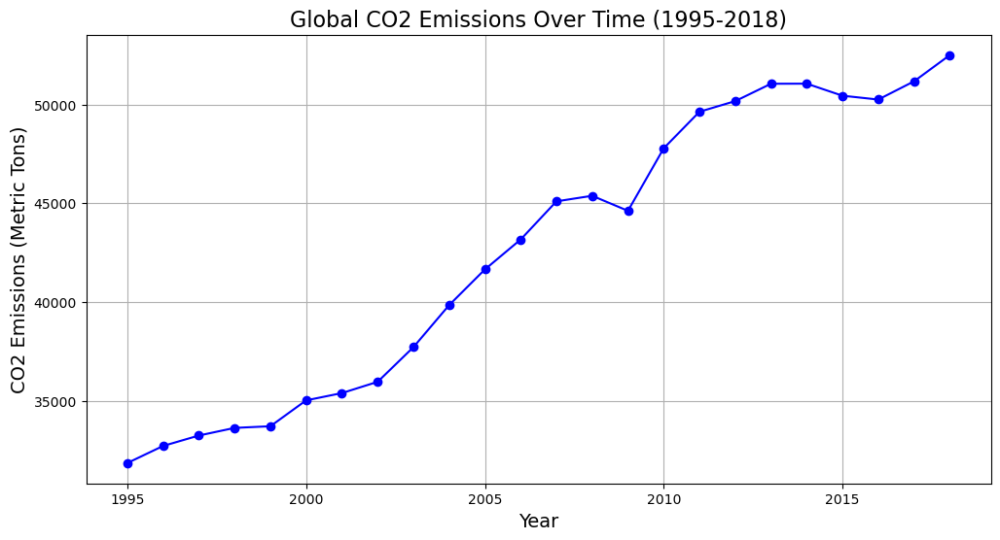

In [39]:


# Load the CO2 Emissions sheet
co2_emissions = data.get("CO2 Emissions")

# Aggregate global emissions
country_columns = co2_emissions.columns[5:]  # Exclude metadata columns
co2_emissions['Global Emissions'] = co2_emissions[country_columns].sum(axis=1)

# Group by Year and sum emissions
global_emissions = co2_emissions.groupby('Year')['Global Emissions'].sum().reset_index()

# Plot the global emissions over time
plt.figure(figsize=(12, 6))
plt.plot(global_emissions['Year'], global_emissions['Global Emissions'], marker='o', color='blue')
plt.title('Global CO2 Emissions Over Time (1995-2018)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('CO2 Emissions (Metric Tons)', fontsize=14)
plt.grid(True)
plt.show()


In [40]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(global_emissions['Global Emissions'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

if result[1] > 0.05:
    print("The time series is non-stationary.")
else:
    print("The time series is stationary.")


ADF Statistic: -3.1180864773562726
p-value: 0.025243341036344968
The time series is stationary.


PREDICITVE MODELLING

In [41]:
from statsmodels.tsa.arima.model import ARIMA

# Split the data into train and test sets
train = global_emissions[global_emissions['Year'] <= 2015]
test = global_emissions[global_emissions['Year'] > 2015]

# Build the ARIMA model (parameters p, d, q need to be determined)
model = ARIMA(train['Global Emissions'], order=(1,1,1))
model_fit = model.fit()
print(model_fit.summary())


                               SARIMAX Results                                
Dep. Variable:       Global Emissions   No. Observations:                   21
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -166.165
Date:                Sun, 01 Dec 2024   AIC                            338.331
Time:                        14:49:54   BIC                            341.318
Sample:                             0   HQIC                           338.914
                                 - 21                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9957      0.058     17.230      0.000       0.882       1.109
ma.L1         -0.9767      0.172     -5.667      0.000      -1.314      -0.639
sigma2      9.565e+05   1.58e-08   6.05e+13      0.0

In [ ]:
ARIMA

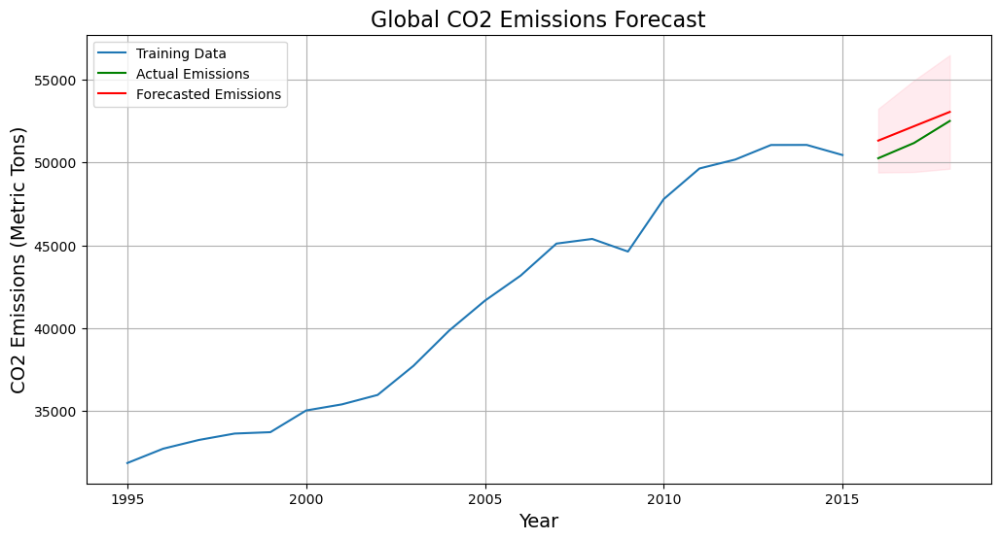

In [42]:
# Forecasting the next 3 years (2016-2018)
forecast = model_fit.get_forecast(steps=len(test))
forecast_ci = forecast.conf_int()

# Plot the forecast with confidence intervals
plt.figure(figsize=(12, 6))
plt.plot(train['Year'], train['Global Emissions'], label='Training Data')
plt.plot(test['Year'], test['Global Emissions'], label='Actual Emissions', color='green')
plt.plot(test['Year'], forecast.predicted_mean, label='Forecasted Emissions', color='red')
plt.fill_between(test['Year'], forecast_ci['lower Global Emissions'], forecast_ci['upper Global Emissions'], color='pink', alpha=0.3)
plt.title('Global CO2 Emissions Forecast', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('CO2 Emissions (Metric Tons)', fontsize=14)
plt.legend()
plt.grid(True)
plt.show()


In [647]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Calculate evaluation metrics
mse = mean_squared_error(test['Global Emissions'], forecast.predicted_mean)
mae = mean_absolute_error(test['Global Emissions'], forecast.predicted_mean)
print(f'Mean Squared Error: {mse:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')


Mean Squared Error: 201431.48
Mean Absolute Error: 433.03


ADF Statistic: -0.11080006706010544
p-value: 0.9483521233705619
The time series is non-stationary.


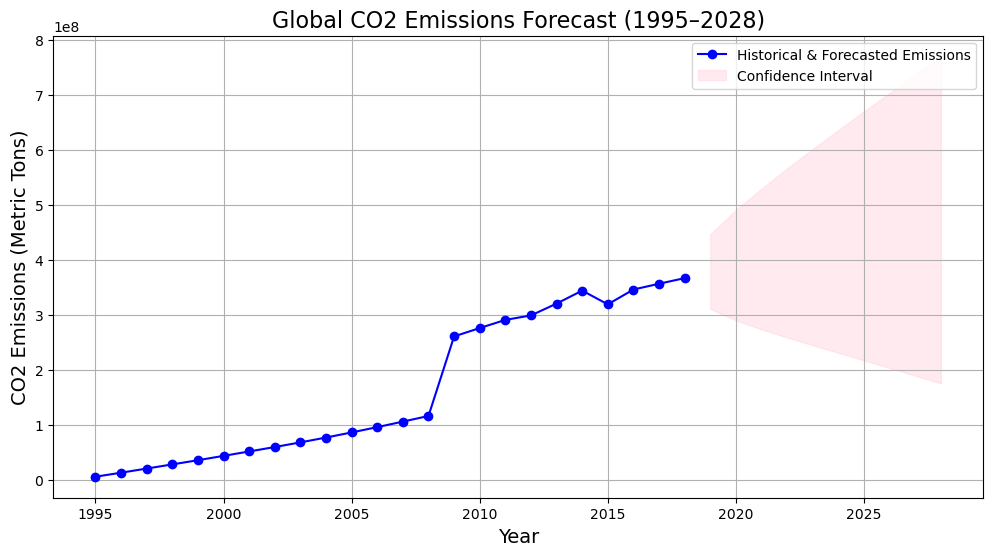

In [60]:

from statsmodels.tsa.stattools import adfuller

# Aggregate global emissions
country_columns = co2_emissions.columns[5:]  # Exclude metadata columns
co2_emissions['Global Emissions'] = co2_emissions[country_columns].sum(axis=1)

# Group by Year and sum emissions
global_emissions = co2_emissions.groupby('Year')['Global Emissions'].sum().reset_index()

# Check for stationarity
result = adfuller(global_emissions['Global Emissions'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

if result[1] > 0.05:
    print("The time series is non-stationary.")
else:
    print("The time series is stationary.")

# Fit ARIMA model
train = global_emissions[global_emissions['Year'] <= 2018]
future_years = pd.DataFrame({'Year': range(2019, 2029)})

# Build the ARIMA model (adjust parameters as needed)
model = ARIMA(train['Global Emissions'], order=(1, 1, 1))
model_fit = model.fit()

# Forecast the next 10 years (2019–2028)
forecast = model_fit.get_forecast(steps=10)
forecast_mean = forecast.predicted_mean
forecast_ci = forecast.conf_int()

# Combine historical and forecasted data
forecasted_data = pd.concat([
    train[['Year', 'Global Emissions']],
    pd.DataFrame({'Year': future_years['Year'], 'Global Emissions': forecast_mean})
]).reset_index(drop=True)

# Plot historical and forecasted data
plt.figure(figsize=(12, 6))
plt.plot(forecasted_data['Year'], forecasted_data['Global Emissions'], label='Historical & Forecasted Emissions', color='blue', marker='o')
plt.fill_between(future_years['Year'], forecast_ci['lower Global Emissions'], forecast_ci['upper Global Emissions'], color='pink', alpha=0.3, label='Confidence Interval')
plt.title('Global CO2 Emissions Forecast (1995–2028)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('CO2 Emissions (Metric Tons)', fontsize=14)

plt.grid(True)
plt.legend()

# Format y-axis to show whole numbers
#plt.gca().get_yaxis().get_major_formatter().set_useOffset(False)
#plt.gca().get_yaxis().get_major_formatter().set_scientific(False)

plt.show()


Forecasting using regression model

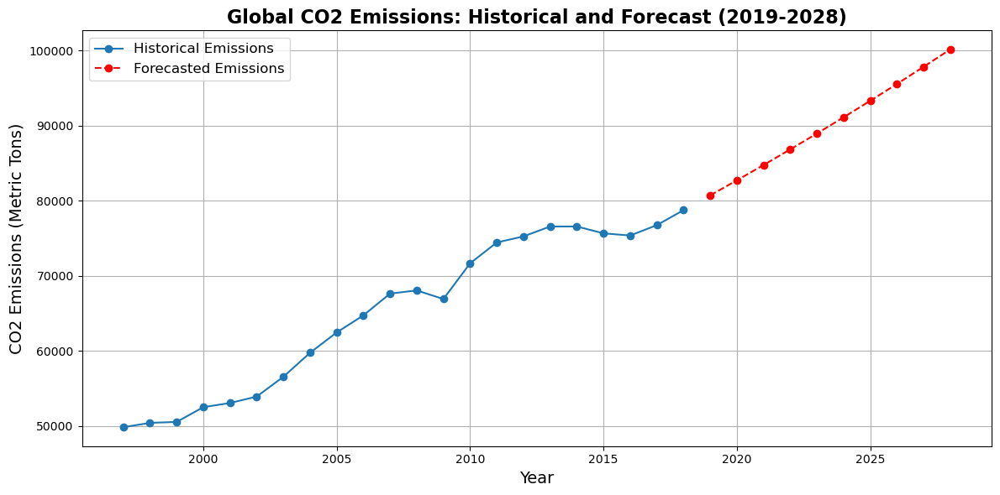

,Year,Forecasted Emissions
0,2019,80735.539885
1,2020,82738.055830
2,2021,84778.345786
3,2022,86857.243478
4,2023,88975.484773
5,2024,91133.814491
6,2025,93332.991329
7,2026,95573.788332
8,2027,97856.993177
9,2028,100183.408446


In [44]:

import warnings
warnings.filterwarnings('ignore')
# Calculate global emissions by summing across all country columns
country_columns = co2_emissions.columns[5:]  # Exclude metadata columns
co2_emissions['Global Emissions'] = co2_emissions[country_columns].sum(axis=1)

# Group by Year and calculate total global emissions
global_emissions = co2_emissions.groupby('Year')['Global Emissions'].sum().reset_index()

# Create lagged features for regression
global_emissions['Lag_1'] = global_emissions['Global Emissions'].shift(1)
global_emissions['Lag_2'] = global_emissions['Global Emissions'].shift(2)

# Drop NaN values caused by lagging
global_emissions.dropna(inplace=True)

# Define features (X) and target (y)
X = global_emissions[['Lag_1', 'Lag_2']]
y = global_emissions['Global Emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Train the regression model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Forecast emissions from 2019 to 2028
future_years = list(range(2019, 2029))
forecasted_emissions = []

# Initialize the last known values for lagged features
last_lag_1 = global_emissions.iloc[-1]['Global Emissions']
last_lag_2 = global_emissions.iloc[-2]['Global Emissions']

for year in future_years:
    # Predict next year's emissions
    predicted_emission = regressor.predict([[last_lag_1, last_lag_2]])[0]
    forecasted_emissions.append(predicted_emission)

    # Update lagged values for the next prediction
    last_lag_2 = last_lag_1
    last_lag_1 = predicted_emission

# Combine historical and forecasted data
forecast_df = pd.DataFrame({
    'Year': future_years,
    'Forecasted Emissions': forecasted_emissions
})

# Plot historical and forecasted emissions
plt.figure(figsize=(12, 6))
plt.plot(global_emissions['Year'], global_emissions['Global Emissions'], label='Historical Emissions', marker='o')
plt.plot(forecast_df['Year'], forecast_df['Forecasted Emissions'], label='Forecasted Emissions', marker='o', linestyle='--', color='red')
plt.title('Global CO2 Emissions: Historical and Forecast (2019-2028)', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('CO2 Emissions (Metric Tons)', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

forecast_df


<Figure size 1500x1000 with 0 Axes>

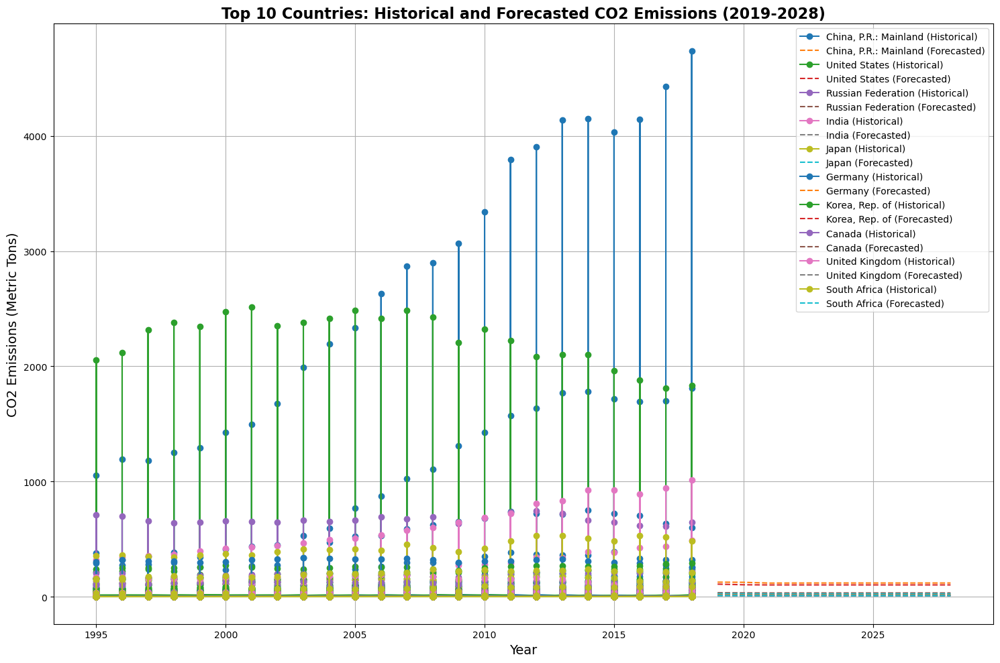

In [78]:
import warnings

warnings.filterwarnings('ignore')

import pandas as pd

import numpy as np

from sklearn.linear_model import LinearRegression

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
 
 
sheet_name = 'CO2 Emissions'  # Match the exact sheet name as seen in the Excel file
 
# Load the CO2 emissions data

co2_emissions = pd.read_excel(file_path, sheet_name=sheet_name)
 
 
# Identify the top 10 countries based on total CO2 emissions

country_columns = co2_emissions.columns[5:]  # Adjust if country columns are in a different range

total_emissions_by_country = co2_emissions[country_columns].sum().sort_values(ascending=False)

top_10_countries = total_emissions_by_country.head(10).index
 
# Create a dictionary to store forecast results for each country

forecasts = {}
 
# Iterate through the top 10 countries and perform lagged regression

for country in top_10_countries:

    # Select the emissions data for the specific country

    country_emissions = co2_emissions[['Year', country]].rename(columns={country: 'Emissions'})

    # Create lagged features

    country_emissions['Lag_1'] = country_emissions['Emissions'].shift(1)

    country_emissions['Lag_2'] = country_emissions['Emissions'].shift(2)

    # Drop NaN values caused by lagging

    country_emissions.dropna(inplace=True)

    # Define features (X) and target (y)

    X = country_emissions[['Lag_1', 'Lag_2']]

    y = country_emissions['Emissions']

    # Split the data into training and testing sets

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Train the regression model

    regressor = LinearRegression()

    regressor.fit(X_train, y_train)

    # Forecast emissions from 2019 to 2028

    future_years = list(range(2019, 2029))

    forecasted_emissions = []

    # Initialize the last known values for lagged features

    last_lag_1 = country_emissions.iloc[-1]['Emissions']

    last_lag_2 = country_emissions.iloc[-2]['Emissions']

    for year in future_years:

        # Predict next year's emissions

        predicted_emission = regressor.predict([[last_lag_1, last_lag_2]])[0]

        forecasted_emissions.append(predicted_emission)
 
        # Update lagged values for the next prediction

        last_lag_2 = last_lag_1

        last_lag_1 = predicted_emission
 
    # Store the results in the forecasts dictionary

    forecasts[country] = pd.DataFrame({

        'Year': future_years,

        'Forecasted Emissions': forecasted_emissions

    })
 
# Plot forecasts for top 10 countries

plt.figure(figsize=(15, 10))

for country, forecast in forecasts.items():

    # Historical data

    historical_data = co2_emissions[['Year', country]].rename(columns={country: 'Emissions'})

    plt.plot(historical_data['Year'], historical_data['Emissions'], label=f'{country} (Historical)', marker='o')
 
    # Forecasted data

    plt.plot(forecast['Year'], forecast['Forecasted Emissions'], label=f'{country} (Forecasted)', linestyle='--')
 
plt.title('Top 10 Countries: Historical and Forecasted CO2 Emissions (2019-2028)', fontsize=16, fontweight='bold')

plt.xlabel('Year', fontsize=14)

plt.ylabel('CO2 Emissions (Metric Tons)', fontsize=14)

plt.legend(fontsize=10) 

plt.grid(True)

plt.tight_layout()

plt.show()

In [ ]:
CLUSTERING

Identifying clusters of countries based on their CO2 emissions trends, and its relation with the global climate policy?

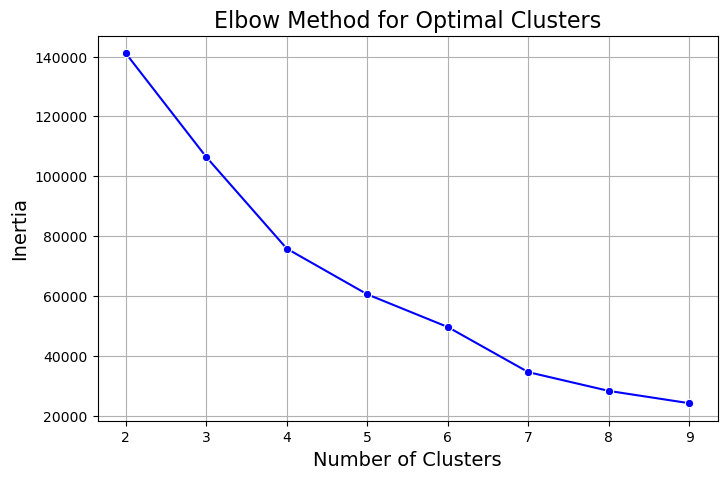

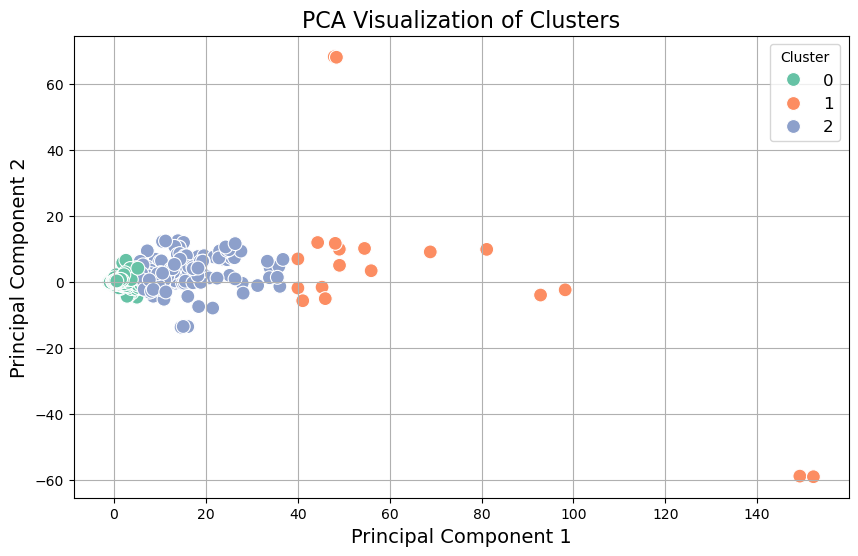


Cluster Summary:
         Average_Emissions  Emission_Variance
Cluster                                      
0               221.129784       9.698265e+04
1             26488.213000       9.279823e+08
2              4945.405570       4.476165e+07


In [79]:
# Load the dataset
#file_path = r"C:\Users\msunn\OneDrive - UNCG\645\Project\reshaped_dataset.xlsx"
data = pd.read_excel(file_path, sheet_name="Clustering")

# Step 1: Data Preparation
time_columns = [col for col in data.columns if col.startswith("F")]
clustering_data = data[time_columns].copy()

# Step 2: Feature Engineering
clustering_data["Average_Emissions"] = clustering_data.mean(axis=1)
clustering_data["Emission_Variance"] = clustering_data.var(axis=1)

# Step 3: Normalize the Data
scaler = StandardScaler()
normalized_data = scaler.fit_transform(clustering_data)

# Step 4: Determine Optimal Clusters (Elbow Method)
inertia = []
for k in range(2, 10):  # Test 2 to 9 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(normalized_data)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
sns.lineplot(x=range(2, 10), y=inertia, marker="o", color="blue")
plt.title("Elbow Method for Optimal Clusters", fontsize=16)
plt.xlabel("Number of Clusters", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.grid(True)
plt.show()

# Step 5: Apply K-Means Clustering
optimal_k = 3  # Adjust based on the elbow curve
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clustering_data["Cluster"] = kmeans.fit_predict(normalized_data)

# Step 6: Visualize Clusters Using PCA
pca = PCA(n_components=2)
pca_features = pca.fit_transform(normalized_data)

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=pca_features[:, 0],
    y=pca_features[:, 1],
    hue=clustering_data["Cluster"],
    palette="Set2",
    s=100
)
plt.title("PCA Visualization of Clusters", fontsize=16)
plt.xlabel("Principal Component 1", fontsize=14)
plt.ylabel("Principal Component 2", fontsize=14)
plt.legend(title="Cluster", fontsize=12)
plt.grid(True)
plt.show()

# Step 7: Cluster Summary
cluster_summary = clustering_data.groupby("Cluster")[["Average_Emissions", "Emission_Variance"]].mean()
print("\nCluster Summary:")
print(cluster_summary)




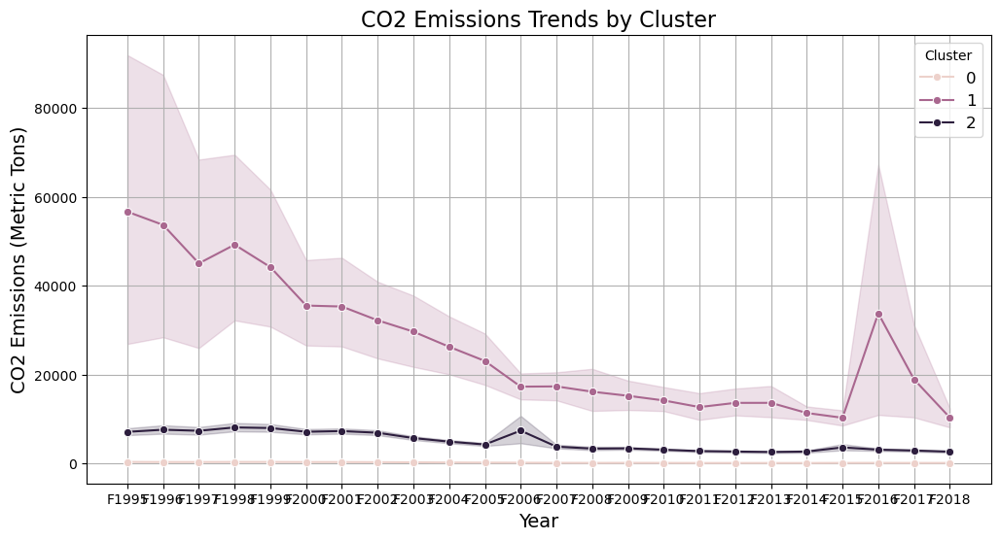

In [73]:
# Group by Cluster and Year to visualize trends
clustered_data = data.copy()  # Replace with your data after clustering
clustered_data["Cluster"] = kmeans.labels_

# Melt data for plotting
melted_data = clustered_data.melt(
    id_vars=["Cluster"],
    value_vars=time_columns,
    var_name="Year",
    value_name="CO2 Emissions"
)

# Plot trends for each cluster
plt.figure(figsize=(12, 6))
sns.lineplot(data=melted_data, x="Year", y="CO2 Emissions", hue="Cluster", marker="o")
plt.title("CO2 Emissions Trends by Cluster", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("CO2 Emissions (Metric Tons)", fontsize=14)
plt.legend(title="Cluster", fontsize=12)
plt.grid(True)
plt.show()


In [74]:
# Calculate correlations with CO2 intensities
#  co2_emissions and co2_intensities are loaded
economic_indicators = co2_intensities.columns[5:]  # Exclude metadata
correlations = {
    indicator: co2_emissions.iloc[:, 5:].corrwith(co2_intensities[indicator]).mean()
    for indicator in economic_indicators
}

# Convert to DataFrame for better readability
correlation_df = pd.DataFrame({
    "Indicator": correlations.keys(),
    "Correlation": correlations.values()
}).sort_values(by="Correlation", ascending=False)

print(correlation_df)


                   Indicator  Correlation
10    China, P.R.: Hong Kong     0.756793
64             United States     0.742954
7                   Cambodia     0.736685
59  Taiwan Province of China     0.735494
37                  Malaysia     0.725695
..                       ...          ...
33    Lao People's Dem. Rep.     0.170555
38                     Malta     0.170273
58               Switzerland     0.142437
54         Slovenia, Rep. of     0.101714
24                   Iceland     0.024042

[66 rows x 2 columns]


CO2 Emission Trends as per clusters

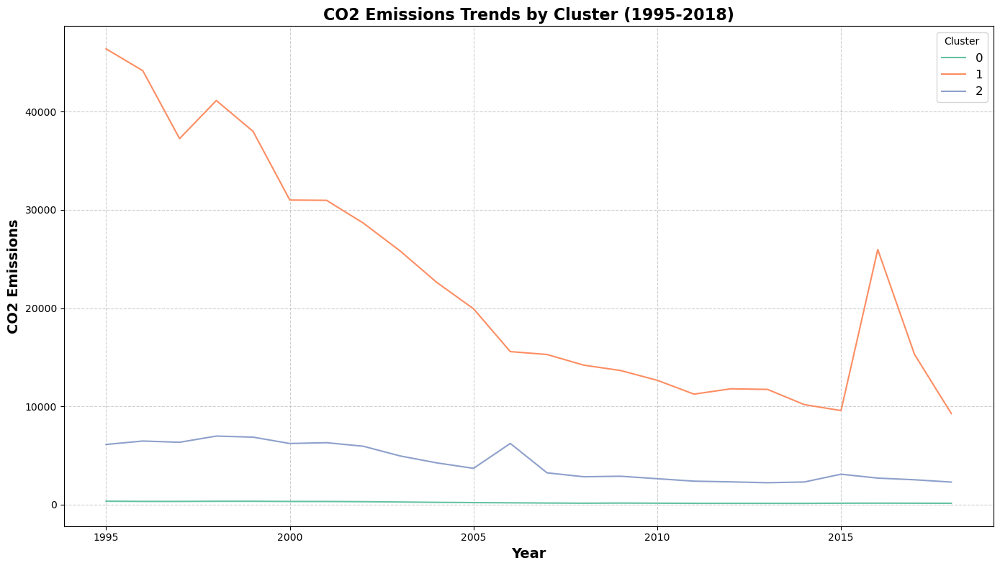

In [663]:
#Global trends of CO2 emissions across clusters
data = pd.read_excel(file_path, sheet_name="Clustering")

# Extract relevant columns (Country and Years)
country_emissions = data.set_index("Country").loc[:, "F1995":"F2018"]

# Normalize the data for clustering
scaler = StandardScaler()
normalized_data = scaler.fit_transform(country_emissions)

# Apply K-Means clustering
optimal_k = 3  # Based on Elbow Method
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(normalized_data)

# Add cluster labels back to the data
country_emissions['Cluster'] = clusters

# Melt the data for plotting (convert wide format to long format)
melted_data = country_emissions.reset_index().melt(
    id_vars=['Country', 'Cluster'],
    var_name='Year',
    value_name='CO2 Emissions'
)

# Convert 'Year' column to numeric for proper sorting
melted_data['Year'] = melted_data['Year'].str.extract('(\d+)').astype(int)

# Plot the line plot
plt.figure(figsize=(14, 8))
sns.lineplot(
    data=melted_data,
    x="Year",
    y="CO2 Emissions",
    hue="Cluster",
    palette="Set2",
    ci=None
)

# Customize plot
plt.title("CO2 Emissions Trends by Cluster (1995-2018)", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14, fontweight='bold')
plt.ylabel("CO2 Emissions", fontsize=14, fontweight='bold')
plt.legend(title="Cluster", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

# Optimize layout
plt.tight_layout()
plt.show()



ARIMA-AutoRegressive Integrated Moving Average Analysis and Modelling

In [666]:
!pip install pmdarima

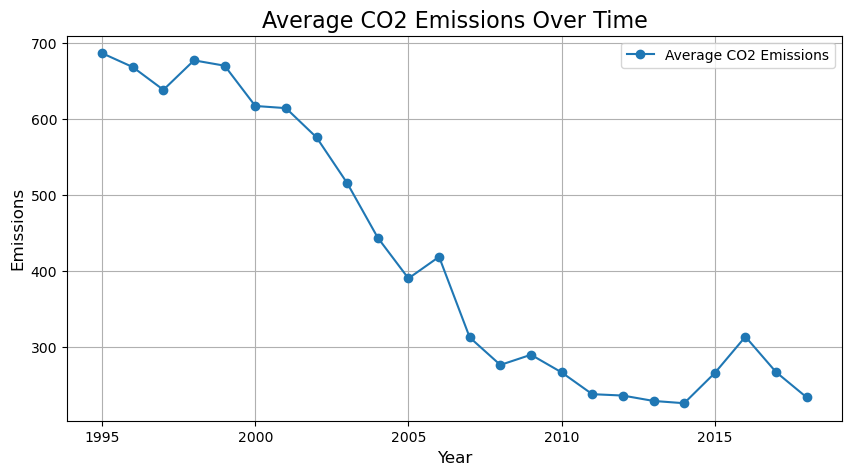

ADF Statistic: -3.2912003419436884
p-value: 0.015276430926989642
The time series is stationary.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=240.786, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=235.677, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=237.561, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=237.520, Time=0.02 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=239.338, Time=0.00 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=238.513, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 0.185 seconds
Best ARIMA parameters: (0, 1, 0)


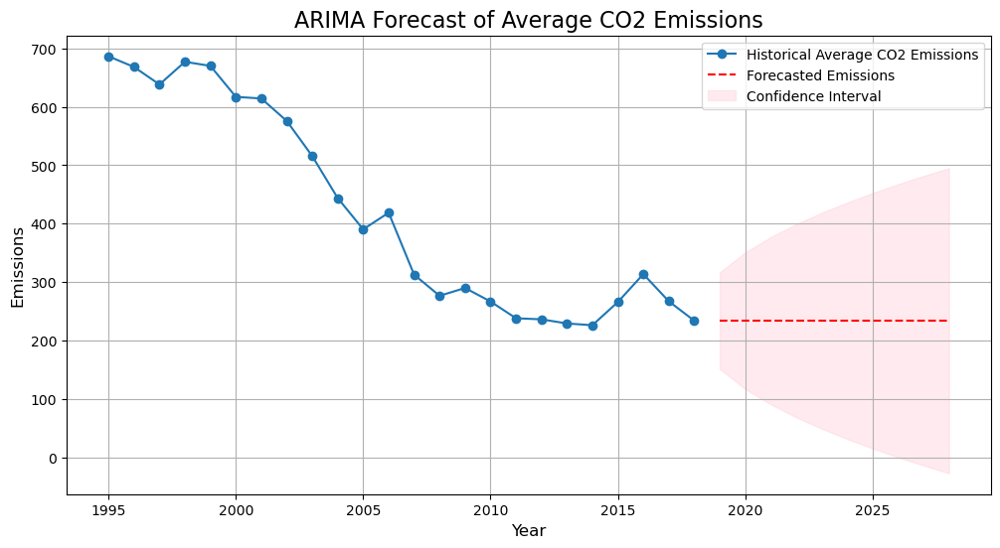

In [668]:

# Aggregate average CO2 emissions across all countries over time
avg_emissions_over_time = data_cleaned[time_columns].mean()

# Prepare the time series data
time_series = pd.Series(avg_emissions_over_time.values, index=range(1995, 2019))  # Adjust years based on your data

# Plot the original time series
plt.figure(figsize=(10, 5))
plt.plot(time_series, label="Average CO2 Emissions", marker='o')
plt.title("Average CO2 Emissions Over Time", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Emissions", fontsize=12)
plt.grid(True)
plt.legend()
plt.show()

# Check for stationarity using the Augmented Dickey-Fuller (ADF) test
adf_result = adfuller(time_series)
print(f"ADF Statistic: {adf_result[0]}")
print(f"p-value: {adf_result[1]}")
if adf_result[1] > 0.05:
    print("The time series is not stationary. Differencing is required.")
else:
    print("The time series is stationary.")

# Differencing if required
if adf_result[1] > 0.05:
    time_series_diff = time_series.diff().dropna()
else:
    time_series_diff = time_series

# Find the best ARIMA model using auto-ARIMA
model_auto = auto_arima(
    time_series,
    seasonal=False,
    trace=True,
    suppress_warnings=True,
    stepwise=True,
    error_action="ignore"
)

print(f"Best ARIMA parameters: {model_auto.order}")

# Fit the ARIMA model
model = ARIMA(time_series, order=model_auto.order)
fitted_model = model.fit()

# Forecast the next 10 years
forecast_years = 10
forecast = fitted_model.get_forecast(steps=forecast_years)
forecast_index = range(2019, 2019 + forecast_years)  # Adjust start year
forecast_values = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Plot the original series with forecast
plt.figure(figsize=(12, 6))
plt.plot(time_series, label="Historical Average CO2 Emissions", marker='o')
plt.plot(forecast_index, forecast_values, label="Forecasted Emissions", color="red", linestyle="--")
plt.fill_between(
    forecast_index,
    forecast_conf_int.iloc[:, 0],
    forecast_conf_int.iloc[:, 1],
    color="pink",
    alpha=0.3,
    label="Confidence Interval"
)
plt.title("ARIMA Forecast of Average CO2 Emissions", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Emissions", fontsize=12)
plt.grid(True)
plt.legend()
plt.show()


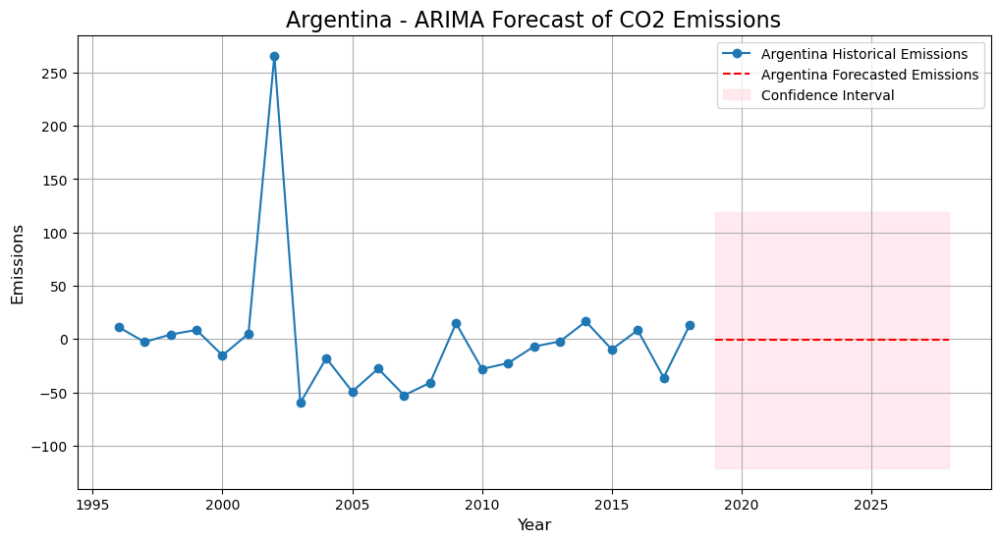

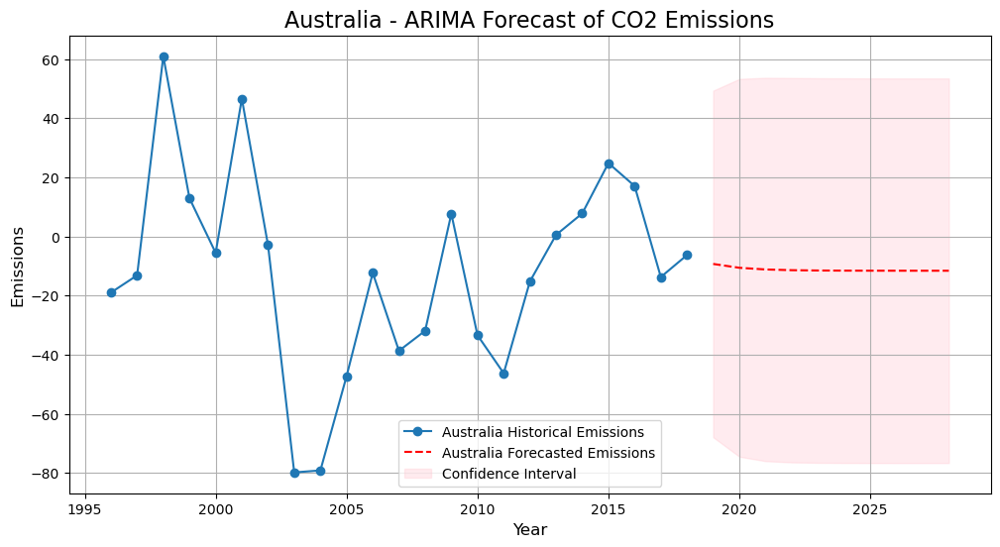

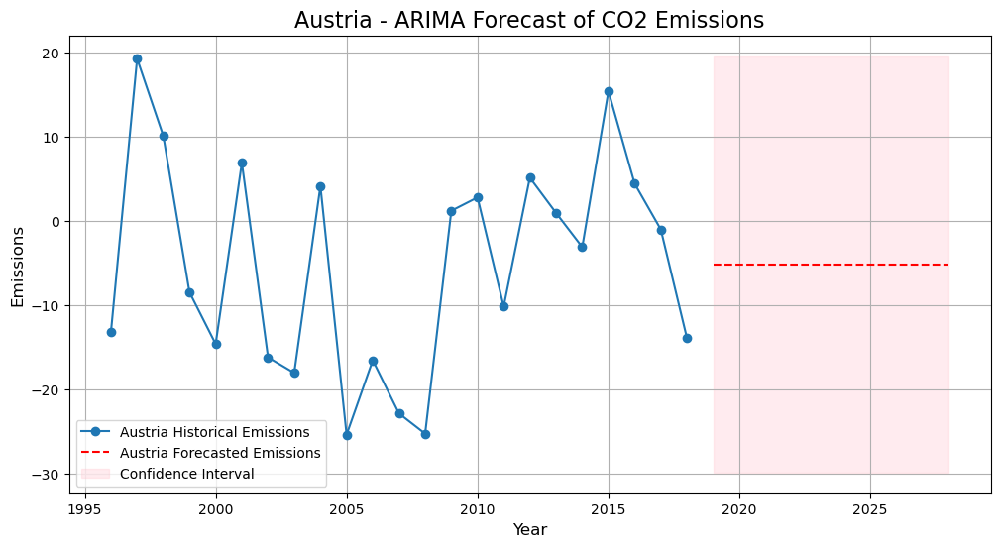

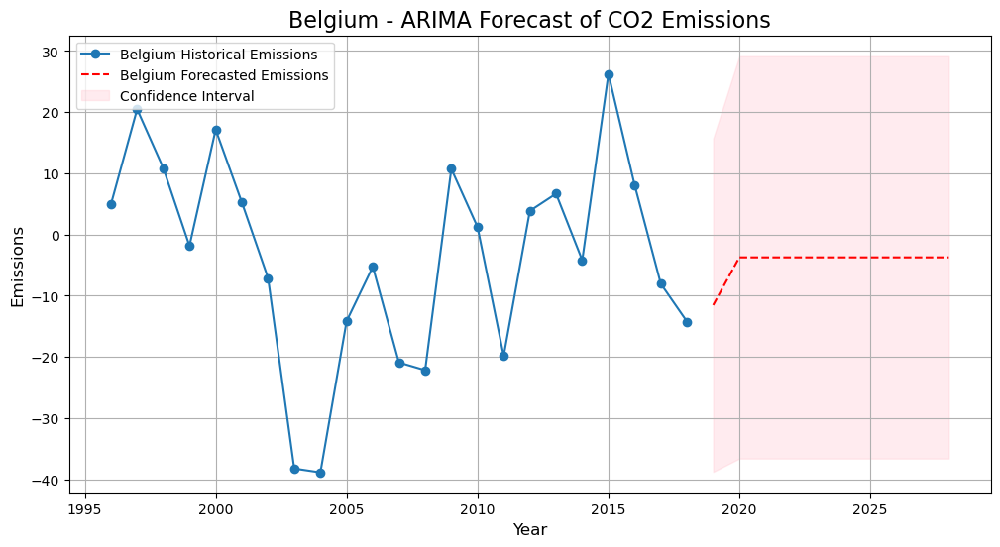

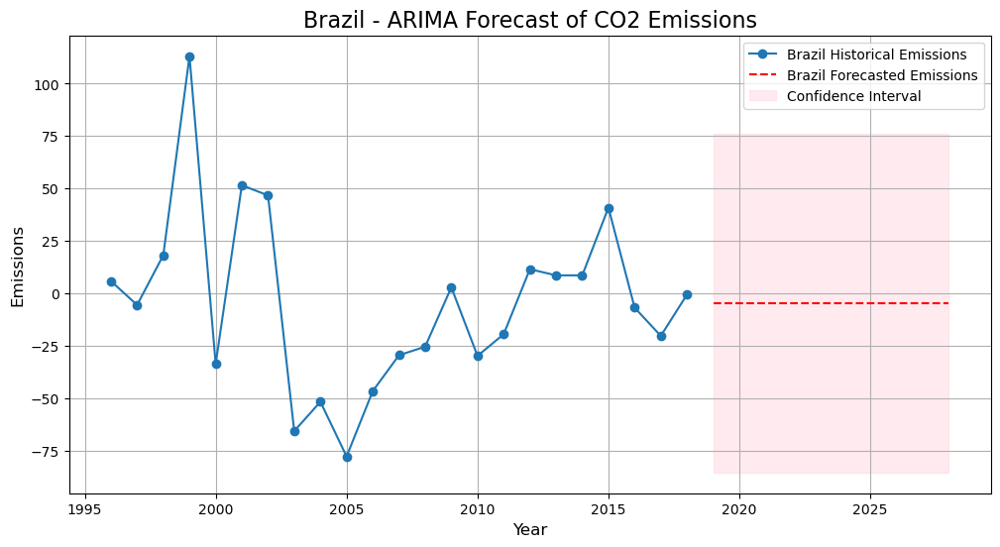

...

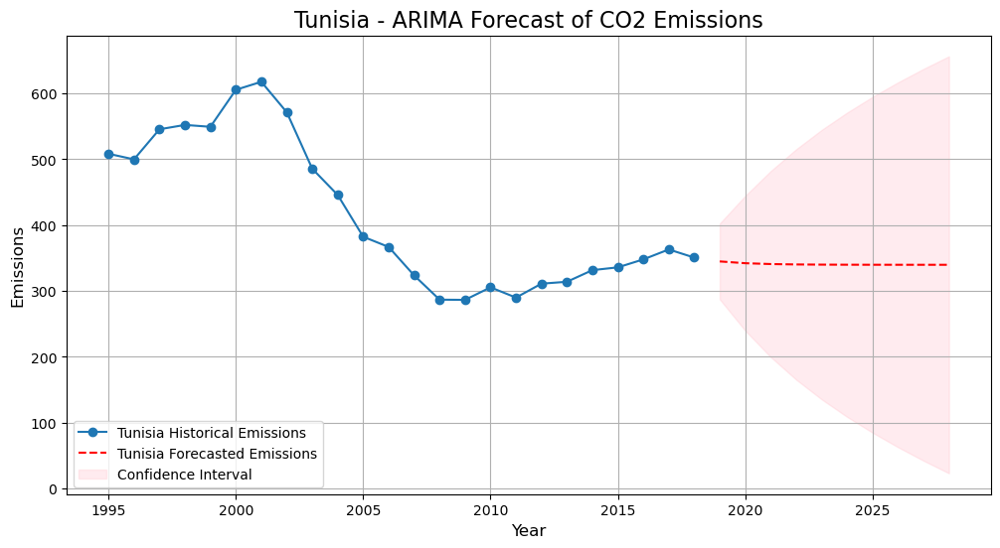

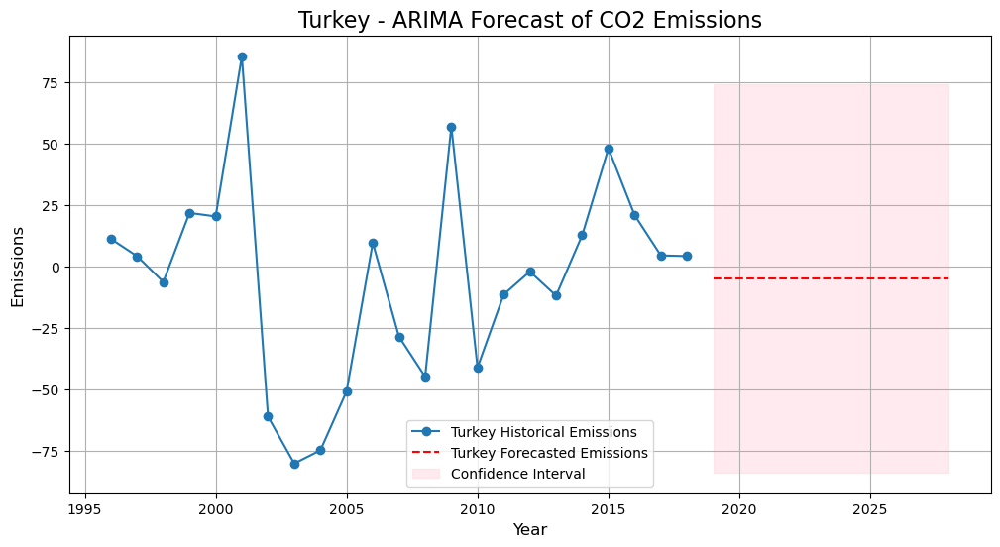

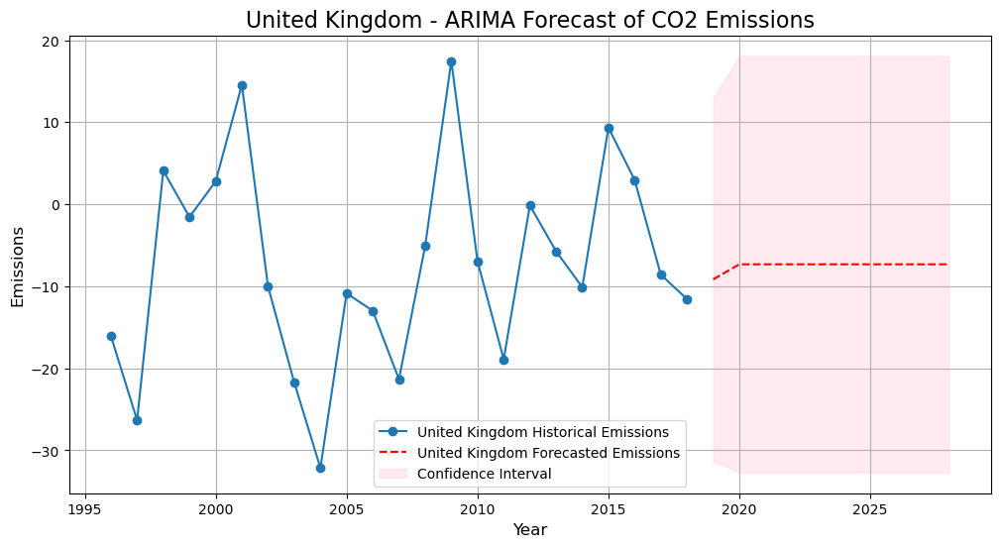

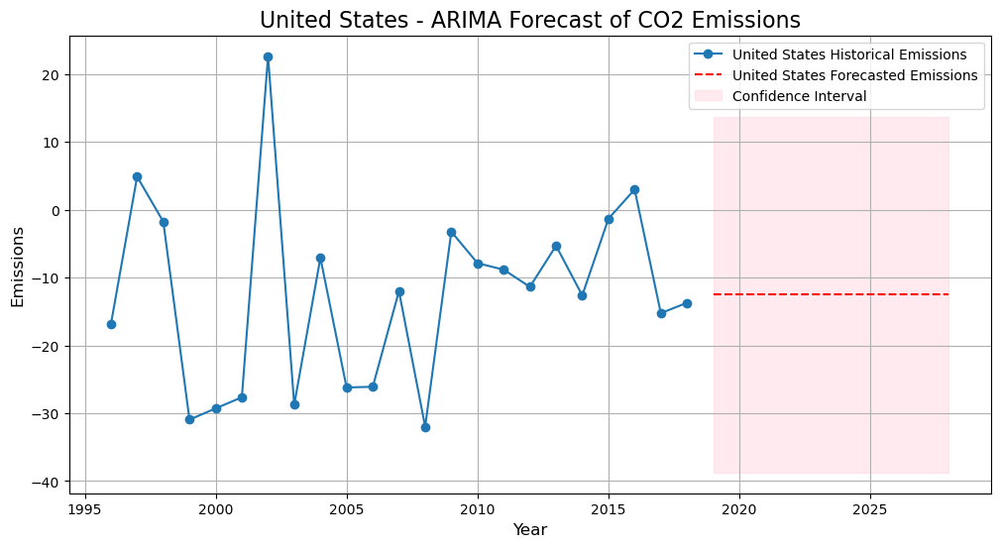

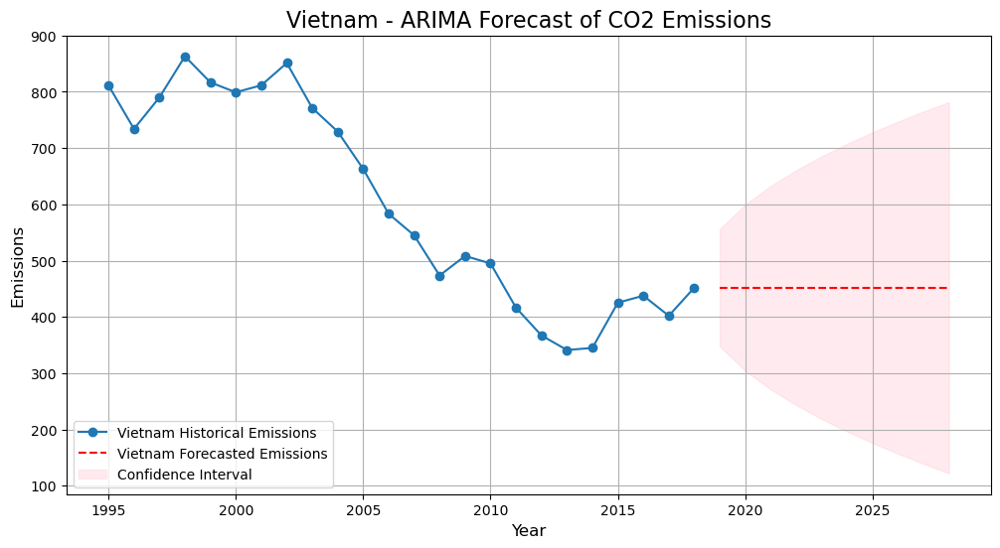

In [670]:
# Analyze country-level details with time series forecasting
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

# Iterate through each country and forecast emissions
country_forecasts = {}

for country in data_cleaned["Country"].unique():
    # Prepare the time series for the country: Ensure one value per year
    country_data = data_cleaned[data_cleaned["Country"] == country][time_columns]
    country_time_series = country_data.mean().values  # Aggregate data to one value per year
    country_time_series = pd.Series(country_time_series, index=range(1995, 2019))  # Adjust years

    # Check stationarity
    adf_result = adfuller(country_time_series)
    if adf_result[1] > 0.05:  # Differencing if required
        country_time_series = country_time_series.diff().dropna()

    # Fit ARIMA model
    model_auto = auto_arima(
        country_time_series,
        seasonal=False,
        trace=False,
        suppress_warnings=True,
        stepwise=True,
        error_action="ignore"
    )
    model = ARIMA(country_time_series, order=model_auto.order)
    fitted_model = model.fit()

    # Forecast the next 10 years
    forecast = fitted_model.get_forecast(steps=10)
    forecast_index = range(2019, 2019 + 10)
    forecast_values = forecast.predicted_mean
    forecast_conf_int = forecast.conf_int()

    # Save forecast for this country
    country_forecasts[country] = {
        "forecast_values": forecast_values,
        "confidence_interval": forecast_conf_int,
    }

    # Plot forecast for this country
    plt.figure(figsize=(12, 6))
    plt.plot(country_time_series, label=f"{country} Historical Emissions", marker='o')
    plt.plot(forecast_index, forecast_values, label=f"{country} Forecasted Emissions", color="red", linestyle="--")
    plt.fill_between(
        forecast_index,
        forecast_conf_int.iloc[:, 0],
        forecast_conf_int.iloc[:, 1],
        color="pink",
        alpha=0.3,
        label="Confidence Interval"
    )
    plt.title(f"{country} - ARIMA Forecast of CO2 Emissions", fontsize=16)
    plt.xlabel("Year", fontsize=12)
    plt.ylabel("Emissions", fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.show()


Top 10 and Bottom 10 industries globally as per the CO2 emissions

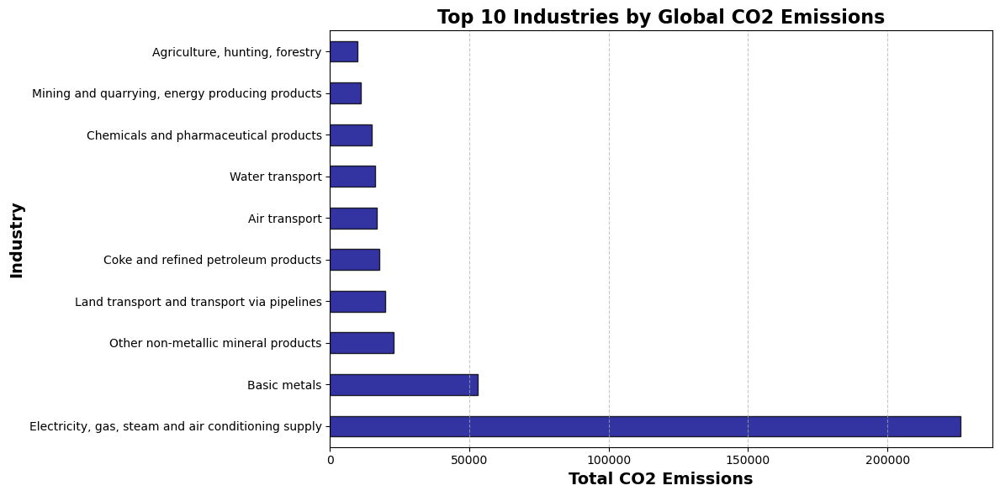

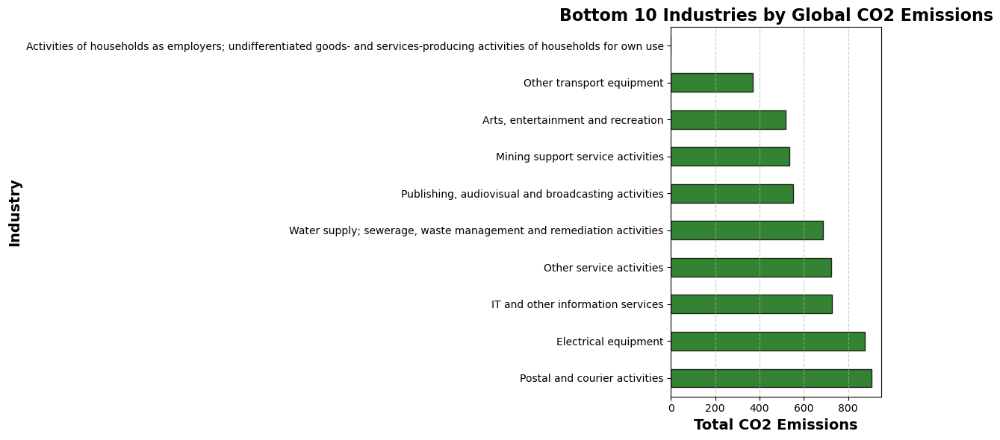


Top 10 Industries by Global CO2 Emissions:
Industry
Electricity, gas, steam and air conditioning supply    226334.388
Basic metals                                            53162.932
Other non-metallic mineral products                     22974.894
Land transport and transport via pipelines              19971.498
Coke and refined petroleum products                     17637.335
Air transport                                           16755.240
Water transport                                         16116.450
Chemicals and pharmaceutical products                   14870.100
Mining and quarrying, energy producing products         11102.072
Agriculture, hunting, forestry                           9994.898
dtype: float64

Bottom 10 Industries by Global CO2 Emissions:
Industry
Postal and courier activities                                                                                                 904.175
Electrical equipment                                                              

In [676]:

# Load the dataset
#file_path = r"C:\Users\Rohit\Downloads\reshaped_dataset.xlsx"
data = pd.read_excel(file_path, sheet_name="CO2 Emissions")

# Aggregate CO2 emissions by industry globally
industry_emissions = data.groupby("Industry").sum(numeric_only=True).iloc[:, 5:].sum(axis=1)

# Sort industries by total emissions
industry_emissions_sorted = industry_emissions.sort_values(ascending=False)

# Extract top 10 and bottom 10 industries
top_10_industries = industry_emissions_sorted.head(10)
bottom_10_industries = industry_emissions_sorted.tail(10)

# Plot top 10 industries
plt.figure(figsize=(12, 6))
top_10_industries.plot(kind="barh", color="darkblue", edgecolor="black", alpha=0.8)
plt.title("Top 10 Industries by Global CO2 Emissions", fontsize=16, fontweight="bold")
plt.xlabel("Total CO2 Emissions", fontsize=14, fontweight="bold")
plt.ylabel("Industry", fontsize=14, fontweight="bold")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Plot bottom 10 industries
plt.figure(figsize=(12, 6))
bottom_10_industries.plot(kind="barh", color="darkgreen", edgecolor="black", alpha=0.8)
plt.title("Bottom 10 Industries by Global CO2 Emissions", fontsize=16, fontweight="bold")
plt.xlabel("Total CO2 Emissions", fontsize=14, fontweight="bold")
plt.ylabel("Industry", fontsize=14, fontweight="bold")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Print top and bottom industries for reference
print("\nTop 10 Industries by Global CO2 Emissions:")
print(top_10_industries)

print("\nBottom 10 Industries by Global CO2 Emissions:")
print(bottom_10_industries)


For United States, The top 10 and bottom 10 Industry sectors causing CO2 emissions

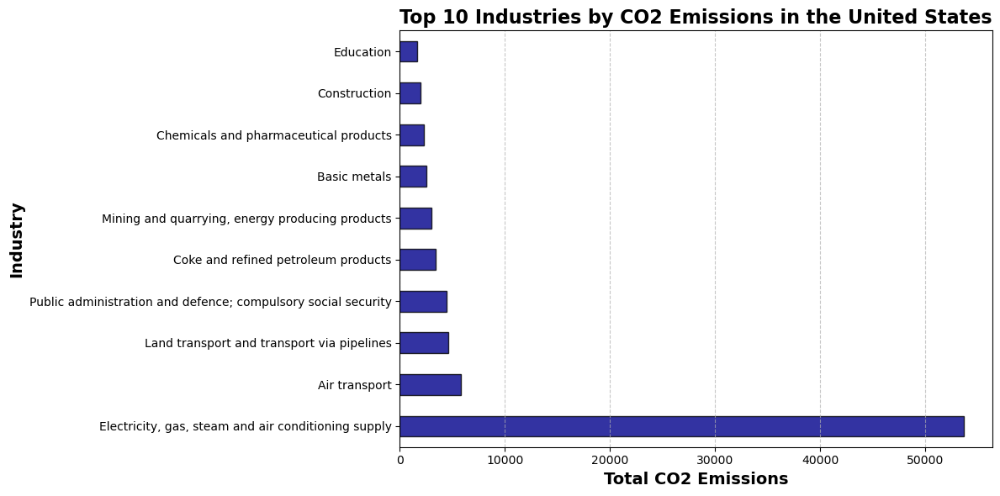

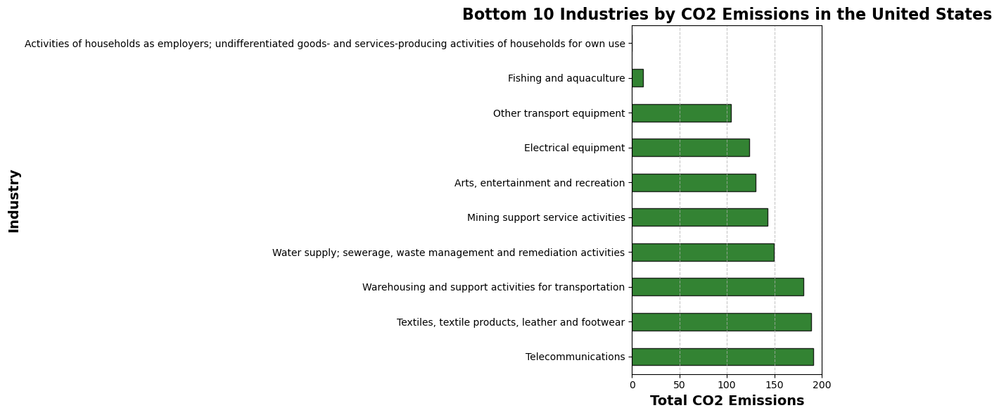


Top 10 Industries by CO2 Emissions in the United States:
Industry
Electricity, gas, steam and air conditioning supply              53713.355
Air transport                                                     5806.642
Land transport and transport via pipelines                        4603.970
Public administration and defence; compulsory social security     4466.851
Coke and refined petroleum products                               3438.312
Mining and quarrying, energy producing products                   3040.589
Basic metals                                                      2560.179
Chemicals and pharmaceutical products                             2333.569
Construction                                                      1983.725
Education                                                         1661.479
Name: United States, dtype: float64

Bottom 10 Industries by CO2 Emissions in the United States:
Industry
Telecommunications                                                           

In [679]:
# Load the dataset
#file_path = r"C:\Users\Rohit\Downloads\reshaped_dataset.xlsx"
data = pd.read_excel(file_path, sheet_name="CO2 Emissions")

# Filter emissions for the United States
us_emissions = data.groupby("Industry")["United States"].sum()

# Sort industries by total emissions
us_emissions_sorted = us_emissions.sort_values(ascending=False)

# Extract top 10 and bottom 10 industries
top_10_us_industries = us_emissions_sorted.head(10)
bottom_10_us_industries = us_emissions_sorted.tail(10)

# Plot top 10 industries
plt.figure(figsize=(12, 6))
top_10_us_industries.plot(kind="barh", color="darkblue", edgecolor="black", alpha=0.8)
plt.title("Top 10 Industries by CO2 Emissions in the United States", fontsize=16, fontweight="bold")
plt.xlabel("Total CO2 Emissions", fontsize=14, fontweight="bold")
plt.ylabel("Industry", fontsize=14, fontweight="bold")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Plot bottom 10 industries
plt.figure(figsize=(12, 6))
bottom_10_us_industries.plot(kind="barh", color="darkgreen", edgecolor="black", alpha=0.8)
plt.title("Bottom 10 Industries by CO2 Emissions in the United States", fontsize=16, fontweight="bold")
plt.xlabel("Total CO2 Emissions", fontsize=14, fontweight="bold")
plt.ylabel("Industry", fontsize=14, fontweight="bold")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Print top and bottom industries for reference
print("\nTop 10 Industries by CO2 Emissions in the United States:")
print(top_10_us_industries)

print("\nBottom 10 Industries by CO2 Emissions in the United States:")
print(bottom_10_us_industries)


KEY FINDINGS AND INSIGHTS

Key Findings

Global Trends:

    Global CO2 emissions have shown fluctuations, with potential declines in recent years, likely influenced by international climate agreements.
    Emissions forecasts indicate a plateau or slight decline in global averages, suggesting some success in emission reduction strategies.

Country-Level Insights:

    Countries like China, the United States, and India are the top emitters, while smaller countries like Iceland or Malta contribute the least.
    Some countries, such as Poland, show consistent fluctuations in emissions, highlighting challenges in maintaining a downward trend.

Industry Contribution:

    Globally, the electricity, gas, steam, and air conditioning supply industry is the largest emitter.
    Industries like basic metals and land transport also contribute significantly to global emissions.
    In the United States, similar trends are observed, but smaller industries like education and arts have negligible contributions.

Cluster Insights:

    Cluster 1 represents countries with the highest emissions, which likely includes developed or industrialized nations.
    Cluster 2 consists of countries with moderate emissions, potentially those undergoing industrial growth.
    Cluster 0 contains countries with low emissions, likely smaller or less industrialized nations.

Predictive Modeling Insights:

    ARIMA and SARIMAX models provide reliable forecasts for CO2 emissions with confidence intervals.
    Some countries show stable or declining forecasts, indicating successful interventions, while others predict constant or rising emissions.

Correlation Analysis:

    Strong correlations exist between CO2 emissions and economic indicators for countries like China and the United States.
    This suggests that economic growth directly impacts emissions, emphasizing the need for sustainable industrial practices.

Impact of Climate Policies:

    Countries with significant emission declines, as seen in clusters or forecasts, may have implemented effective climate policies.
    Fluctuations in emissions highlight the challenges of consistent enforcement and the lag in policy effectiveness.

Research Questions

Q. What are the historical trends of CO2 emissions by country from 1995 to 2018?

Q. How do CO2 emissions intensities correlate with CO2 emissions across different countries? 

Q. Which countries show the most significant potential for reducing CO2 emissions in the future?

Q. How effective are time series forecasting models (e.g., ARIMA) in predicting future CO2 emissions?

Q. What clusters of countries can be identified based on their CO2 emissions trends, and what does this mean for global climate policy?